In [1]:
import os

import numpy as np

import pandas as pd
from pandas.plotting import table

import matplotlib.pyplot as plt

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

import seaborn as sns

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score

from geopy.geocoders import ArcGIS

from arcgis.gis import GIS
from arcgis.geocoding import get_geocoders, batch_geocode

import folium # Mapping package

import pyodbc

import sqlalchemy
from sqlalchemy import create_engine

#from geopy.geocoders import Nominatim

In [2]:
os.chdir('C:\\Users\\marky\\OneDrive\\Documents\\Data Science\\Project Portfolio\\KPMG Internship - New Customer Profit Predictor\\')
os.getcwd()

'C:\\Users\\marky\\OneDrive\\Documents\\Data Science\\Project Portfolio\\KPMG Internship - New Customer Profit Predictor'

In [3]:
os.listdir()

['.ipynb_checkpoints',
 'Average Customer Transactions.PNG',
 'Average Profit from Transaction by Month.png',
 'Average Profit per Transaction by Wealth.png',
 'Bike Related Purchases Past 3 Years.png',
 'coordinates.csv',
 'customer map.html',
 'Customer Profit Predictor',
 'customer profits average by product.csv',
 'customer profits by product.csv',
 'customer profits total by product.csv',
 'Customers and Transactions - SQL Server Structure',
 'Customers by DOB.png',
 'Customers by Wealth by Birth Year.png',
 'customers pairplot multipurchase.png',
 'customer_address.csv',
 'customer_demographic.csv',
 'customer_demographic_address_profits.csv',
 'Customer_Profit_Predictor',
 'df_coordinates.csv',
 'Evaluation Scores.png',
 'Feature Importance Scores.png',
 'Functions to Build',
 'Internship Material',
 'KPMG Internship README.md',
 'KPMG Virtual Internship - Task 2 - Presentation on Potential Data Insights.pdf',
 'KPMG Virtual Internship - Task 3 - Presentation on Results.pdf',
 '

In [4]:
transactions=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='Transactions',skiprows=1)
# transactions.to_csv('transactions.csv') # Already written

In [5]:
transactions['product_profit']=(transactions['list_price']-transactions['standard_cost'])
transactions['profit_margin']=(1-(transactions['standard_cost']/transactions['list_price']))

In [6]:
# Transaction dataset preview
transactions.head(15)

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,17.87,0.249965
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,1702.55,0.814045
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,1544.61,0.861260
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,817.36,0.682009
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,1055.82,0.598097
5,6,25,2339,2017-03-08,1.0,Approved,Giant Bicycles,Road,medium,medium,1538.99,829.65,39031.0,709.34,0.460913
6,7,22,1542,2017-04-21,1.0,Approved,WeareA2B,Standard,medium,medium,60.34,45.26,34165.0,15.08,0.249917
7,8,15,2459,2017-07-15,0.0,Approved,WeareA2B,Standard,medium,medium,1292.84,13.44,39915.0,1279.40,0.989604
8,9,67,1305,2017-08-10,0.0,Approved,Solex,Standard,medium,large,1071.23,380.74,33455.0,690.49,0.644577
9,10,12,3262,2017-08-30,1.0,Approved,WeareA2B,Standard,medium,medium,1231.15,161.60,38216.0,1069.55,0.868741


In [7]:
transactions.shape

(20000, 15)

In [8]:
# Checking for potential duplicates in transaction id
transactions[transactions['transaction_id'].duplicated(keep=False)]

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin


In [9]:
transactions.drop(columns=['transaction_id','product_id','customer_id','product_first_sold_date']).describe()

,online_order,list_price,standard_cost,product_profit,profit_margin
count,19640.000000,20000.000000,19803.000000,19803.000000,19803.000000
mean,0.500458,1107.829449,556.046951,551.950915,0.446065
std,0.500013,582.825242,405.955660,493.412849,0.264221
min,0.000000,12.010000,7.210000,4.800000,0.072214
25%,0.000000,575.270000,215.140000,133.780000,0.249973
50%,1.000000,1163.890000,507.580000,445.210000,0.399998
75%,1.000000,1635.300000,795.100000,830.240000,0.676080
max,1.000000,2091.470000,1759.850000,1702.550000,0.989604


In [10]:
# Finding missing values by 'product_id'
transactions['product_id'][transactions['brand'].isna() == True].value_counts()

0    197
Name: product_id, dtype: int64

All missing values are from 'product_id' = 0

#### Inspecting missing rows

In [11]:
# Find empty rows within transaction dataset to inspect, find their 'list_value' to match to current 'list_value'
missing_transactions = transactions['list_price'][transactions['brand'].isna() == True].sort_values(ascending=False).values
missing_transactions

array([2086.07, 2076.81, 2064.08, 2062.95, 2061.38, 2052.92, 2037.77,
       2028.26, 2020.14, 2012.84, 1999.54, 1997.68, 1989.3 , 1978.64,
       1972.01, 1958.34, 1957.87, 1942.61, 1934.41, 1922.94, 1919.23,
       1888.45, 1880.4 , 1862.82, 1833.17, 1817.13, 1790.31, 1788.93,
       1780.22, 1776.08, 1761.75, 1759.3 , 1740.16, 1734.3 , 1719.95,
       1711.35, 1711.35, 1709.26, 1703.18, 1697.27, 1695.42, 1689.63,
       1678.71, 1678.51, 1672.07, 1660.68, 1656.86, 1624.69, 1617.32,
       1615.62, 1578.52, 1571.83, 1563.94, 1562.88, 1541.62, 1541.1 ,
       1535.84, 1527.25, 1502.93, 1497.43, 1487.8 , 1480.76, 1476.88,
       1473.09, 1438.9 , 1413.98, 1409.68, 1401.63, 1392.76, 1374.2 ,
       1349.47, 1348.41, 1315.16, 1300.96, 1294.66, 1294.37, 1292.13,
       1285.47, 1281.6 , 1233.12, 1224.41, 1223.24, 1220.66, 1216.4 ,
       1202.34, 1199.26, 1196.65, 1193.44, 1192.33, 1184.  , 1181.89,
       1163.77, 1150.59, 1148.41, 1146.42, 1142.89, 1107.08, 1102.68,
       1099.68, 1098

In [12]:
pd.DataFrame(missing_transactions).nunique()

0    196
dtype: int64

In [13]:
len(missing_transactions)

197

In [14]:
# Find 'list_price' for non-null values within the transaction dataset, to find potential matches to missing values that can be plugged in
product0_transactions = transactions['list_price'][(transactions['brand'].isna() == False)].value_counts().index.sort_values(ascending=False)
product0_transactions

Float64Index([2091.47, 2083.94, 2005.66, 1992.93, 1977.36, 1945.43, 1894.19,
              1890.39, 1873.97, 1842.92, 1812.75,  1810.0, 1807.45, 1793.43,
               1777.8, 1775.81, 1769.64,  1765.3, 1762.96,  1720.7, 1703.52,
              1661.92,  1636.9,  1635.3, 1577.53, 1555.58, 1538.99,  1483.2,
              1469.44, 1466.68, 1458.17, 1415.01,  1403.5, 1386.84, 1362.99,
              1311.44, 1292.84, 1289.85, 1280.28, 1274.93, 1240.31, 1231.15,
              1228.07, 1227.34, 1216.14, 1198.46,  1179.0, 1172.78, 1163.89,
              1151.96, 1148.64, 1129.13, 1073.07, 1071.23, 1065.03, 1061.56,
              1057.51, 1036.59, 1024.66,  980.37,  958.74,  945.04,  912.52,
               795.34,   792.9,  774.53,  752.64,  748.17,  742.54,  688.63,
                642.7,  642.31,  590.26,  586.45,  575.27,  574.64,  569.56,
               544.05,  543.39,  533.51,  499.53,  495.72,  478.16,  441.49,
               416.98,  363.01,   360.4,  358.39,  290.62,  235.63,  230.91,

In [15]:
pd.DataFrame(product0_transactions).nunique()

0    100
dtype: int64

In [16]:
len(product0_transactions)

100

In [17]:
# Search for matches in missing rows vs rows without missing data - to try to find matching list prices (to fill in na values)
set(missing_transactions).intersection(product0_transactions)

set()

All missing values come from product_id = 0

No overlap/matches in missing prices vs given prices

In [18]:
# Pandas profiler not working
# profile = ProfileReport(transactions)

In [19]:
# profile.to_widgets()

In [20]:
# profile.to_notebook_iframe()

## Analyze by amount transaction as well

In [21]:
# Groupby by 'customer_id'
customer_transactions_orders_count=pd.DataFrame(transactions.groupby(['customer_id'])['transaction_id'].nunique())
customer_transactions_average_profit_margin=pd.DataFrame(transactions.groupby(['customer_id'])['profit_margin'].mean())
customer_transactions_total_list_price=pd.DataFrame(transactions.groupby(['customer_id'])['list_price'].sum())
customer_transactions_total_profits=pd.DataFrame(transactions.groupby(['customer_id'])['product_profit'].sum())
customer_transactions_average_profit=pd.DataFrame(transactions.groupby(['customer_id'])['product_profit'].mean())

customer_transactions_profits=pd.concat([customer_transactions_orders_count,customer_transactions_average_profit_margin,customer_transactions_total_list_price,customer_transactions_total_profits,customer_transactions_average_profit],axis=1)
customer_transactions_profits.columns=(['transactions_count','customer_profit_margin_average','transactions_total_list_price','transactions_total_profit','profit_per_transactions'])
customer_transactions_profits.head()

,transactions_count,customer_profit_margin_average,transactions_total_list_price,transactions_total_profit,profit_per_transactions
customer_id,,,,,
1,11,0.322590,9084.45,3018.09,274.371818
2,3,0.554722,4149.07,2226.26,742.086667
3,8,0.306902,9888.23,3362.81,420.351250
4,2,0.223743,1047.72,220.57,110.285000
5,6,0.342018,5903.20,2394.94,399.156667


In [22]:
transactions.groupby(['customer_id'])['transaction_id'].nunique().value_counts()

5     601
6     569
4     499
7     476
3     361
8     311
9     207
2     202
10    112
11     60
1      49
12     28
13     16
14      3
Name: transaction_id, dtype: int64

In [23]:
# Create profit variables to combine with customer dataset
customer_profit_total=pd.DataFrame(transactions.groupby(['customer_id'])['product_profit'].sum()).rename(columns={"product_profit": "3_year_product_profit"})
customer_average_profit=pd.DataFrame(transactions.groupby(['customer_id'])['product_profit'].mean()).rename(columns={"product_profit": "3_year_average_product_profit"})
customer_profit_margins=pd.DataFrame(transactions.groupby(['customer_id'])['profit_margin'].mean()).rename(columns={"profit_margin": "3_year_product_profit_margin"})

customer_profits=pd.concat([customer_profit_total,customer_average_profit,customer_profit_margins],axis=1)
customer_profits

,3_year_product_profit,3_year_average_product_profit,3_year_product_profit_margin
customer_id,,,
1,3018.090000,274.371818,0.322590
2,2226.260000,742.086667,0.554722
3,3362.810000,420.351250,0.306902
4,220.570000,110.285000,0.223743
5,2394.940000,399.156667,0.342018
...,...,...,...
3497,1648.320000,549.440000,0.389262
3498,3147.330000,524.555000,0.469457
3499,4955.250000,707.892857,0.562465


In [24]:
transactions.count()

transaction_id             20000
product_id                 20000
customer_id                20000
transaction_date           20000
online_order               19640
order_status               20000
brand                      19803
product_line               19803
product_class              19803
product_size               19803
list_price                 20000
standard_cost              19803
product_first_sold_date    19803
product_profit             19803
profit_margin              19803
dtype: int64

In [25]:
transactions.count().sum() / (transactions.shape[0] * transactions.shape[1])

0.9935466666666667

In [26]:
transactions['online_order']=transactions['online_order'].fillna(0.0)

In [27]:
transactions.count()

transaction_id             20000
product_id                 20000
customer_id                20000
transaction_date           20000
online_order               20000
order_status               20000
brand                      19803
product_line               19803
product_class              19803
product_size               19803
list_price                 20000
standard_cost              19803
product_first_sold_date    19803
product_profit             19803
profit_margin              19803
dtype: int64

In [28]:
transactions=transactions.dropna()

In [29]:
transactions.count()

transaction_id             19803
product_id                 19803
customer_id                19803
transaction_date           19803
online_order               19803
order_status               19803
brand                      19803
product_line               19803
product_class              19803
product_size               19803
list_price                 19803
standard_cost              19803
product_first_sold_date    19803
product_profit             19803
profit_margin              19803
dtype: int64

In [30]:
monthly_transactions=transactions.set_index('transaction_date')['transaction_id'].resample('M').nunique()
monthly_transactions.index=monthly_transactions.index.strftime('%B')
monthly_transactions=pd.DataFrame(monthly_transactions)
monthly_transactions.columns = ['Total Transactions']
monthly_transactions.index.name='Transaction Month'
# monthly_transactions_plot=monthly_transactions.plot(xticks=range(len(monthly_transactions)),figsize=(15,10)).set_title('Transactions by Month');

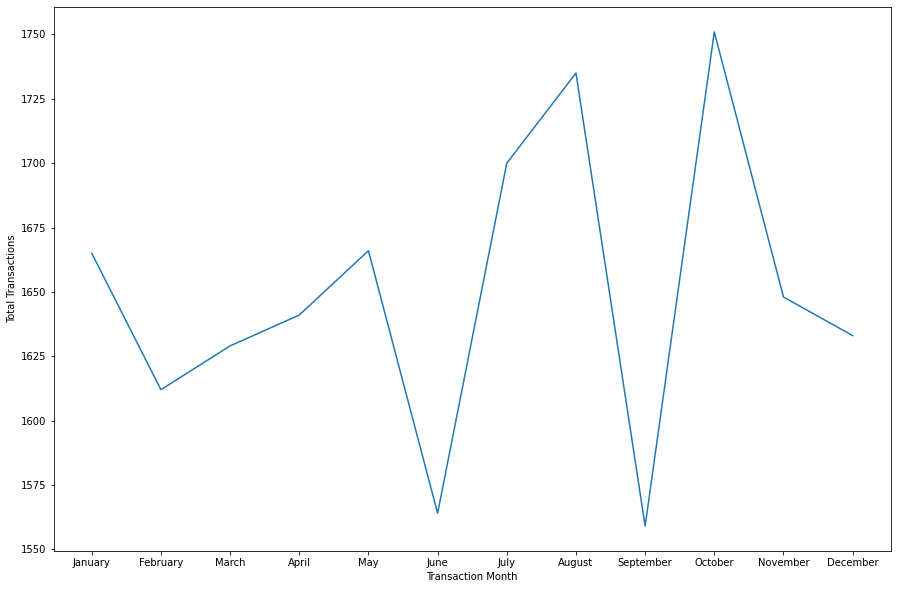

In [31]:
plt.subplots(figsize = [15, 10])
monthly_transactions_plot = sns.lineplot(data = monthly_transactions, x = monthly_transactions.index, y = 'Total Transactions' , sort = False);
monthly_transactions_plot;

In [32]:
monthly_transactions_plot.figure.savefig('Transactions by Month.png')

In [33]:
transactions_by_month=transactions.set_index('transaction_date')
transactions_by_month.index=transactions_by_month.index.strftime('%B')
transactions_by_month=transactions_by_month.reset_index()

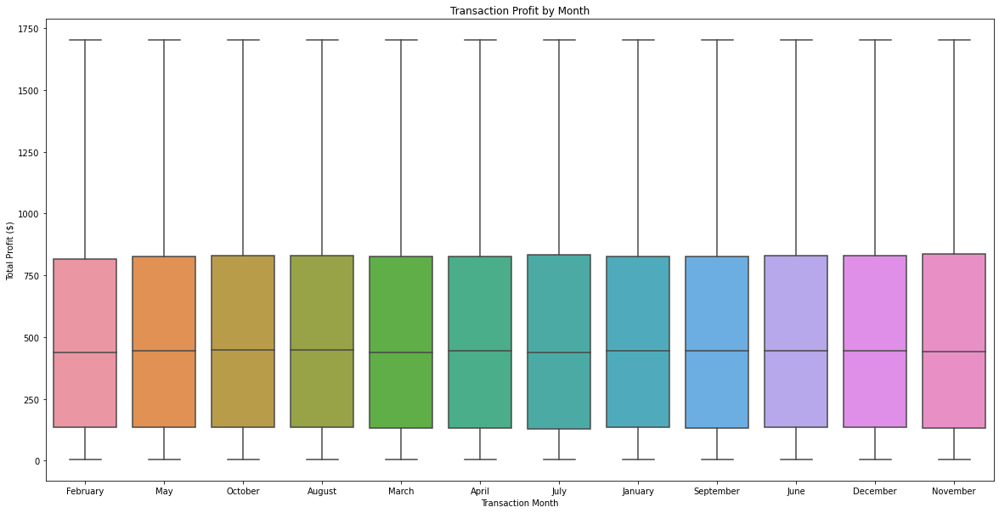

In [34]:
# Plot by wealth segment for number of purhcases, transaction profit and count
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='transaction_date',y='product_profit',data=transactions_by_month)
ax.set_title("Transaction Profit by Month")
ax.set_xlabel("Transaction Month")
ax.set_ylabel("Total Profit ($)");

In [35]:
monthly_transactions_box=ax
monthly_transactions_box.figure.savefig('Transactions Profit by Month.png')

In [36]:
monthly_transactions.T

Transaction Month,January,February,March,April,May,June,July,August,September,October,November,December
Total Transactions,1665,1612,1629,1641,1666,1564,1700,1735,1559,1751,1648,1633


In [37]:
transactions.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date', 'product_profit', 'profit_margin'],
      dtype='object')

In [38]:
transactions.sort_values('product_id')

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
2313,2314,0,3250,2017-07-29,0.0,Approved,OHM Cycles,Standard,low,medium,71.16,56.93,38647.0,14.23,0.199972
12940,12941,0,1103,2017-11-06,0.0,Approved,Giant Bicycles,Standard,medium,medium,230.91,173.18,37337.0,57.73,0.250011
977,978,0,2210,2017-11-11,0.0,Approved,Norco Bicycles,Standard,low,medium,363.01,290.41,38482.0,72.60,0.199994
5902,5903,0,329,2017-05-21,0.0,Approved,Trek Bicycles,Road,medium,medium,533.51,400.13,37220.0,133.38,0.250005
12944,12945,0,2827,2017-02-05,0.0,Approved,Solex,Road,medium,medium,416.98,312.74,35560.0,104.24,0.249988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6882,6883,100,2727,2017-09-19,1.0,Approved,Trek Bicycles,Standard,medium,small,1386.84,1234.29,35378.0,152.55,0.109998
9902,9903,100,1293,2017-05-05,1.0,Approved,Norco Bicycles,Road,medium,medium,1036.59,206.35,33364.0,830.24,0.800934
4693,4694,100,3399,2017-05-02,1.0,Approved,Norco Bicycles,Road,medium,medium,1036.59,206.35,33364.0,830.24,0.800934
7017,7018,100,989,2017-11-27,1.0,Approved,Norco Bicycles,Road,medium,medium,1036.59,206.35,41922.0,830.24,0.800934


In [39]:
transactions_product_ids=transactions.set_index('product_id').sort_index()
transactions_product_ids.to_csv('transactions sorted product ids.csv')

In [40]:
# Groupby by 'product_id'
transactions_product_orders_count=pd.DataFrame(transactions.groupby(['product_id'])['product_profit'].count())
transactions_product_average_profit=pd.DataFrame(transactions.groupby(['product_id'])['product_profit'].mean())
transactions_product_total_profits=pd.DataFrame(transactions.groupby(['product_id'])['product_profit'].sum())
transactions_average_product_profit=pd.DataFrame(transactions.groupby(['product_id'])['profit_margin'].mean())

customer_profits=pd.concat([transactions_product_orders_count,transactions_average_product_profit,transactions_product_average_profit,transactions_product_total_profits],axis=1)
customer_profits.columns=(['total_product_sales','average_profit_margin','average_product_profit','total_product_profit'])
customer_profits.head()

,total_product_sales,average_profit_margin,average_product_profit,total_product_profit
product_id,,,,
0,1181,0.292589,89.634035,105857.794972
1,311,0.348596,522.683023,162554.420000
2,240,0.223139,26.889833,6453.560000
3,354,0.814045,1702.550000,602702.700000
4,241,0.534871,687.540290,165697.210000


In [41]:
customer_profits.describe()

,total_product_sales,average_profit_margin,average_product_profit,total_product_profit
count,101.000000,101.000000,101.000000,101.000000
mean,196.069307,0.450080,576.985106,108220.633317
std,105.330552,0.232774,453.858750,91114.491763
min,121.000000,0.089658,26.889833,4861.000000
25%,161.000000,0.257083,193.801351,35771.920000
50%,188.000000,0.401292,522.683023,97353.700000
75%,204.000000,0.599835,802.260000,158934.990000
max,1181.000000,0.972686,1702.550000,602702.700000


In [42]:
transactions.set_index('transaction_date').resample('M').sum()

,transaction_id,product_id,customer_id,online_order,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
transaction_date,,,,,,,,,
2017-01-31,16678615,76363,2859439,830.0,1850099.86,920612.120012,63511432.0,929487.739988,748.596073
2017-02-28,16336702,71989,2775962,796.0,1784040.19,913221.130000,61645395.0,870819.060000,707.068246
2017-03-31,16353580,75846,2780477,773.0,1786816.92,907573.520000,62093284.0,879243.400000,720.556400
2017-04-30,16055412,73185,2907670,820.0,1826490.02,921798.710000,62598968.0,904691.310000,723.222114
2017-05-31,16614280,76441,2914234,823.0,1890884.30,977141.690000,63648328.0,913742.610000,722.075164
2017-06-30,15699282,72308,2785171,757.0,1740222.76,880651.210000,59740192.0,859571.550000,698.456084
2017-07-31,16848521,77376,2946762,811.0,1871957.66,933338.370000,64724776.0,938619.290000,757.041027
2017-08-31,17229961,79859,2964956,874.0,1917743.67,947291.150000,66424947.0,970452.520000,788.641048
2017-09-30,15867271,71232,2704975,760.0,1731203.84,868913.350000,59513895.0,862290.490000,700.321771


In [43]:
# Sort out above dataframe with .mean() and .count()

In [44]:
customer_profits.sort_values('average_profit_margin',ascending=False).to_csv('customer profits average by product.csv')

In [45]:
customer_profits.sort_values('total_product_profit',ascending=False).to_csv('customer profits total by product.csv')

In [46]:
customer_profits.sort_values('total_product_sales',ascending=False).to_csv('customer profits by product.csv')

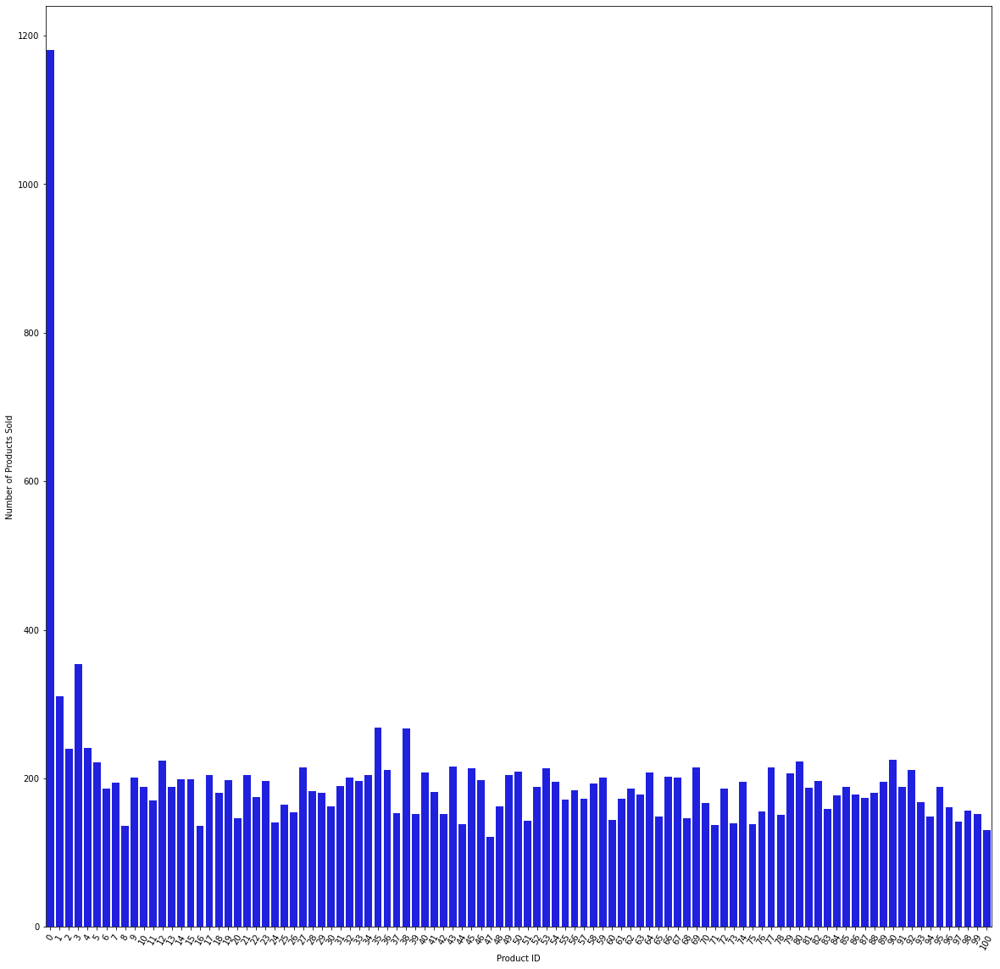

In [47]:
ax = plt.subplots(figsize=[20,20])
ax = sns.barplot(x=customer_profits.index, y=customer_profits['total_product_sales'],color='blue')
ax.set_xlabel('Product ID')
ax.set_ylabel("Number of Products Sold")
ax.set_xticklabels(customer_profits.index,rotation=60)
plt.show();

In [48]:
customer_profits.sort_values('total_product_sales',ascending=False).head(10)

,total_product_sales,average_profit_margin,average_product_profit,total_product_profit
product_id,,,,
0,1181,0.292589,89.634035,105857.794972
3,354,0.814045,1702.550000,602702.700000
1,311,0.348596,522.683023,162554.420000
35,268,0.602791,689.460075,184775.300000
38,267,0.616578,1146.599888,306142.170000
4,241,0.534871,687.540290,165697.210000
2,240,0.223139,26.889833,6453.560000
90,225,0.275945,178.004000,40050.900000
12,224,0.809537,1066.546562,238906.430000


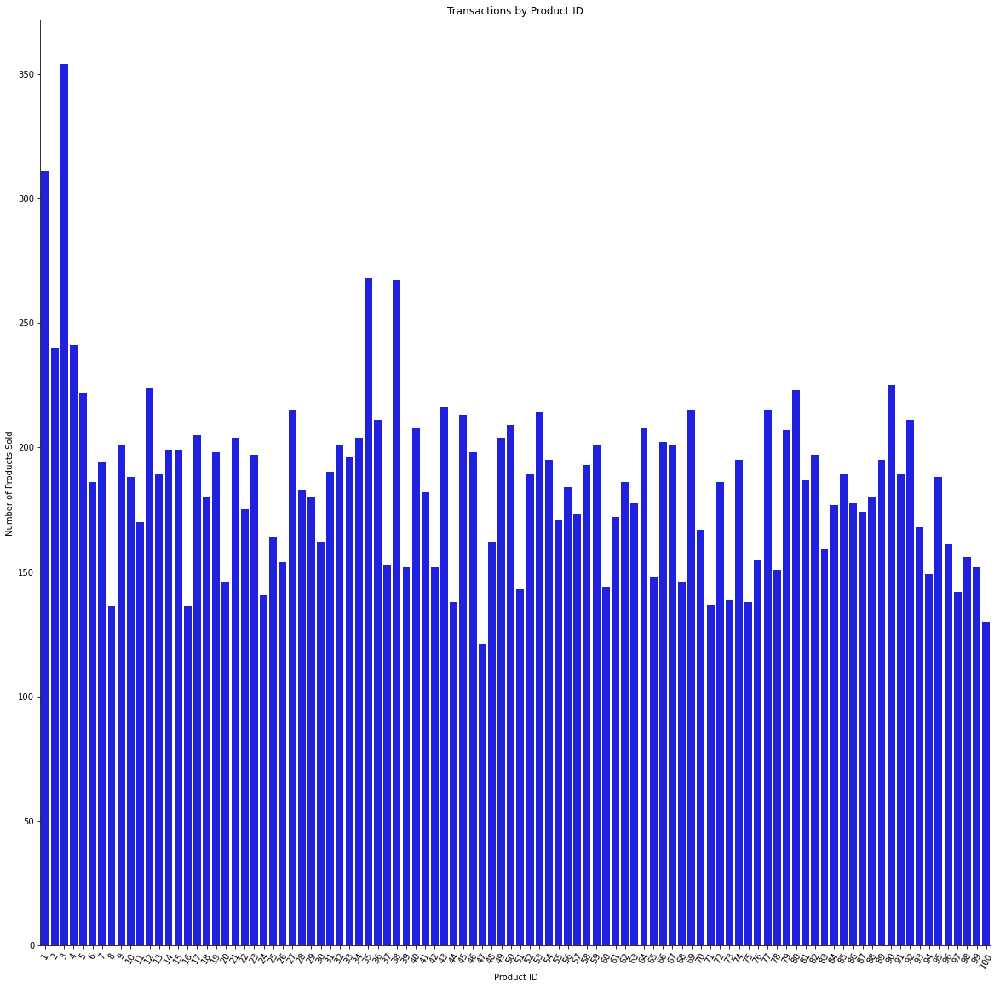

In [49]:
ax = plt.subplots(figsize=[20,20])
ax = sns.barplot(x=customer_profits.index[1:], y=customer_profits['total_product_sales'][1:],color='blue')
ax.set_title('Transactions by Product ID')
ax.set_xlabel('Product ID')
ax.set_ylabel("Number of Products Sold")
ax.set_xticklabels(customer_profits.index[1:],rotation=60)
plt.show();

In [50]:
customer_profits[1:].sort_values('total_product_sales',ascending=False).head(10)

,total_product_sales,average_profit_margin,average_product_profit,total_product_profit
product_id,,,,
3,354,0.814045,1702.550000,602702.70
1,311,0.348596,522.683023,162554.42
35,268,0.602791,689.460075,184775.30
38,267,0.616578,1146.599888,306142.17
4,241,0.534871,687.540290,165697.21
2,240,0.223139,26.889833,6453.56
90,225,0.275945,178.004000,40050.90
12,224,0.809537,1066.546562,238906.43
80,223,0.235930,307.017713,68464.95


In [51]:
customer_profits['average_profit_margin'][1:]*100

product_id
1      34.859571
2      22.313885
3      81.404467
4      53.487060
5      24.684910
         ...    
96     18.191014
97     20.285977
98     53.927023
99     28.919654
100    57.770850
Name: average_profit_margin, Length: 100, dtype: float64

In [52]:
fig = go.Figure(data=[go.Scatter(
    x = customer_profits.index[1:],
    y = customer_profits['total_product_sales'][1:],
    mode = 'markers',
    marker_size = (customer_profits['average_profit_margin'][1:]*75))
])

fig.update_layout(
    title="Sales by Product ID",
    xaxis_title="Product ID",
    yaxis_title="Number of Products Sold",
    )

product_id_plot=fig.show()
product_id_plot

In [53]:
fig = go.Figure(data=[go.Scatter(
    x = customer_profits.index[1:],
    y = customer_profits['total_product_sales'][1:],
    mode = 'markers',
    marker_size = (customer_profits['average_profit_margin'][1:]*25))
])

fig.update_layout(
    title="Sales by Product ID",
    xaxis_title="Product ID",
    yaxis_title="Number of Products Sold",
    )


fig.show()

In [54]:
# Group transactions by transaction ID to calculate: average items per transaction, average profits ($ & %) per transaction
 # Then calculate by customer group (total, average, %) and merge with customer dataset
# pd.DataFrame(groupby.)

In [55]:
bikes_counts=pd.DataFrame(transactions.groupby(['brand'])['product_id'].count().sort_values(ascending=False))
bikes_average_list_price=pd.DataFrame(transactions.groupby(['brand'])['list_price'].mean().sort_values(ascending=False))
bikes_average_profit=pd.DataFrame(transactions.groupby(['brand'])['product_profit'].mean().sort_values(ascending=False))
bikes_average_profit_margin=pd.DataFrame(transactions.groupby(['brand'])['profit_margin'].mean().sort_values(ascending=False))

In [56]:
bikes_counts_average_list=pd.merge(bikes_counts,bikes_average_list_price,left_index=True,right_index=True)
bikes_counts_average_list_profit=pd.merge(bikes_counts_average_list,bikes_average_profit,left_index=True,right_index=True)
bikes_counts_average_list_profit_profit_margins=pd.merge(bikes_counts_average_list_profit,bikes_average_profit_margin,left_index=True,right_index=True)

In [57]:
# Create bubble plot by 'product_id'/count and profit margin (with colors by product line)
fig = go.Figure(data=[go.Scatter(
    x = bikes_counts_average_list_profit_profit_margins.index,
    y = bikes_counts_average_list_profit_profit_margins['product_id'],
    mode = 'markers',
    marker_size = (bikes_counts_average_list_profit_profit_margins['profit_margin']*100))
])

fig.update_layout(
    title="Sales by Product ID",
    xaxis_title="Brand",
    yaxis_title="Number of Products Sold",
    )


fig.show()

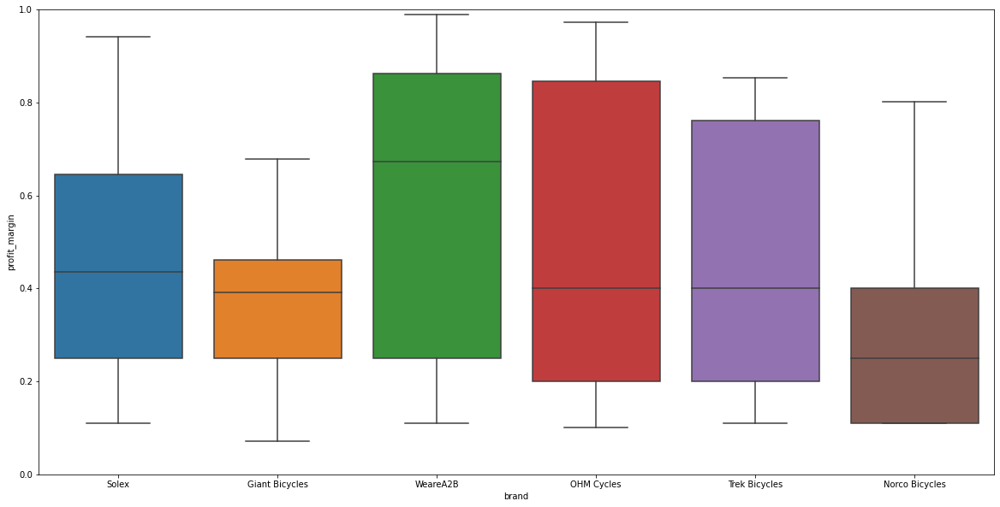

In [58]:
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='brand',y='profit_margin',data=transactions,order=bikes_counts_average_list_profit_profit_margins.index)
ax.set_ylim(0,1);

In [59]:
customer_brand_dummies=pd.get_dummies(transactions['brand'])
customer_brand_dummies=pd.merge(left=customer_brand_dummies,right=transactions['transaction_date'],left_index=True,right_index=True)
customer_brand_dummies=customer_brand_dummies.set_index('transaction_date').resample('M').sum()
customer_brand_dummies.index=customer_brand_dummies.index.strftime('%B')
customer_brand_dummies

,Giant Bicycles,Norco Bicycles,OHM Cycles,Solex,Trek Bicycles,WeareA2B
transaction_date,,,,,,
January,280.0,246.0,265.0,367.0,228.0,279.0
February,268.0,241.0,225.0,341.0,258.0,279.0
March,239.0,255.0,267.0,353.0,249.0,266.0
April,265.0,262.0,251.0,360.0,240.0,263.0
May,301.0,239.0,232.0,341.0,286.0,267.0
June,261.0,226.0,253.0,329.0,243.0,252.0
July,280.0,236.0,285.0,365.0,276.0,258.0
August,297.0,232.0,278.0,381.0,256.0,291.0
September,248.0,212.0,235.0,354.0,235.0,275.0


In [60]:
fig = go.Figure()
for i in range(len(customer_brand_dummies.columns)):
    fig.add_trace(go.Scatter(x=customer_brand_dummies.index, y=customer_brand_dummies[customer_brand_dummies.columns[i]],name=customer_brand_dummies.columns[i]))

fig.update_xaxes(title_text="Transaction Month")
fig.update_yaxes(title_text="Number of Transactions")
fig.show()

In [61]:
bikes_counts_average_list_profit_profit_margins.columns=['products_sold','average_list_price','average_product_profit','average_profit_margin']
bikes_counts_average_list_profit_profit_margins

,products_sold,average_list_price,average_product_profit,average_profit_margin
brand,,,,
Solex,4253,1057.271956,567.564450,0.479113
Giant Bicycles,3312,1235.407204,475.193351,0.357766
WeareA2B,3295,1263.454813,835.780021,0.604987
OHM Cycles,3043,983.706983,487.360776,0.452162
Trek Bicycles,2990,1183.783398,614.707090,0.453706
Norco Bicycles,2910,913.202450,298.173117,0.304089


Sort by 'list_price' - high-to-low

In [62]:
bikes_counts_average_list_profit_profit_margins.sort_values('average_list_price',ascending=False)

,products_sold,average_list_price,average_product_profit,average_profit_margin
brand,,,,
WeareA2B,3295,1263.454813,835.780021,0.604987
Giant Bicycles,3312,1235.407204,475.193351,0.357766
Trek Bicycles,2990,1183.783398,614.707090,0.453706
Solex,4253,1057.271956,567.564450,0.479113
OHM Cycles,3043,983.706983,487.360776,0.452162
Norco Bicycles,2910,913.202450,298.173117,0.304089


Sort by 'profit_margin' - high-to-low

In [63]:
bikes_counts_average_list_profit_profit_margins.sort_values('average_profit_margin',ascending=False)

,products_sold,average_list_price,average_product_profit,average_profit_margin
brand,,,,
WeareA2B,3295,1263.454813,835.780021,0.604987
Solex,4253,1057.271956,567.564450,0.479113
Trek Bicycles,2990,1183.783398,614.707090,0.453706
OHM Cycles,3043,983.706983,487.360776,0.452162
Giant Bicycles,3312,1235.407204,475.193351,0.357766
Norco Bicycles,2910,913.202450,298.173117,0.304089


In [64]:
# Bubble plot here - based on products sold and profit margin (and list price - color scale)

In [65]:
bikes_line_counts=pd.DataFrame(transactions.groupby(['product_line'])['product_id'].count().sort_values(ascending=False))
bikes_line_average_list_price=pd.DataFrame(transactions.groupby(['product_line'])['list_price'].mean().sort_values(ascending=False))
bikes_line_average_profit=pd.DataFrame(transactions.groupby(['product_line'])['product_profit'].mean().sort_values(ascending=False))
bikes_line_average_profit_margin=pd.DataFrame(transactions.groupby(['product_line'])['profit_margin'].mean().sort_values(ascending=False))

In [66]:
bikes_line_counts_average_list=pd.merge(bikes_line_counts,bikes_line_average_list_price,left_index=True,right_index=True)
bikes_line_counts_average_list_profit=pd.merge(bikes_line_counts_average_list,bikes_line_average_profit,left_index=True,right_index=True)
bikes_line_counts_average_list_profit_profit_margins=pd.merge(bikes_line_counts_average_list_profit,bikes_line_average_profit_margin,left_index=True,right_index=True)

In [67]:
# Create bubble plot by 'product_id'/count and profit margin (with colors by product line)
fig = go.Figure(data=[go.Scatter(
    x = bikes_line_counts_average_list_profit_profit_margins.index,
    y = bikes_line_counts_average_list_profit_profit_margins['product_id'],
    mode = 'markers',
    marker_size = (bikes_line_counts_average_list_profit_profit_margins['profit_margin']*100))
])

fig.update_layout(
    title="Sales by Product ID",
    xaxis_title="Product Line",
    yaxis_title="Number of Products Sold",
    )


fig.show()

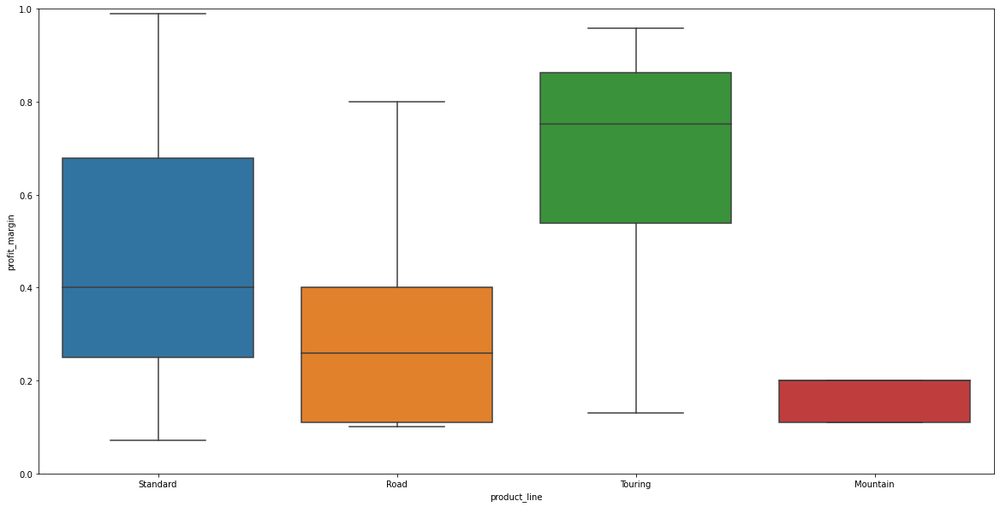

In [68]:
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='product_line',y='profit_margin',data=transactions,order=bikes_line_counts_average_list_profit_profit_margins.index)
ax.set_ylim(0,1);

In [69]:
customer_product_line_dummies=pd.get_dummies(transactions['product_line'])
customer_product_line_dummies=pd.merge(left=customer_product_line_dummies,right=transactions['transaction_date'],left_index=True,right_index=True)
customer_product_line_dummies=customer_product_line_dummies.set_index('transaction_date').resample('M').sum()
customer_product_line_dummies.index=customer_product_line_dummies.index.strftime('%B')
customer_product_line_dummies

,Mountain,Road,Standard,Touring
transaction_date,,,,
January,33.0,336.0,1190.0,106.0
February,36.0,292.0,1190.0,94.0
March,39.0,326.0,1178.0,86.0
April,46.0,340.0,1154.0,101.0
May,45.0,338.0,1167.0,116.0
June,30.0,307.0,1130.0,97.0
July,32.0,379.0,1201.0,88.0
August,36.0,325.0,1252.0,122.0
September,30.0,279.0,1154.0,96.0


In [70]:
fig = go.Figure()
for i in range(len(customer_product_line_dummies.columns)):
    fig.add_trace(go.Scatter(x=customer_product_line_dummies.index, y=customer_product_line_dummies[customer_product_line_dummies.columns[i]],name=customer_product_line_dummies.columns[i]))

fig.update_xaxes(title_text="Transaction Month")
fig.update_yaxes(title_text="Number of Transactions")
fig.show()

In [71]:
# Rename columns
bikes_line_counts_average_list_profit_profit_margins.columns=['products_sold','average_list_price','average_product_profit','average_profit_margin']
bikes_line_counts_average_list_profit_profit_margins = round(bikes_line_counts_average_list_profit_profit_margins, 2)
bikes_table = bikes_line_counts_average_list_profit_profit_margins
bikes_table.columns = bikes_table.columns.str.replace('_',' ')
bikes_table.columns = bikes_table.columns.str.title()
bikes_table

,Products Sold,Average List Price,Average Product Profit,Average Profit Margin
product_line,,,,
Standard,14176,1102.92,574.14,0.47
Road,3970,1018.02,352.74,0.33
Touring,1234,1620.21,1094.13,0.65
Mountain,423,628.54,96.41,0.16


In [72]:
bikes_table['Products Sold'].sum()

19803

In [73]:
bikes_class_counts=pd.DataFrame(transactions.groupby(['product_class'])['product_id'].count().sort_values(ascending=False))
bikes_class_average_list_price=pd.DataFrame(transactions.groupby(['product_class'])['list_price'].mean().sort_values(ascending=False))
bikes_class_average_profit=pd.DataFrame(transactions.groupby(['product_class'])['product_profit'].mean().sort_values(ascending=False))
bikes_class_average_profit_margin=pd.DataFrame(transactions.groupby(['product_class'])['profit_margin'].mean().sort_values(ascending=False))

In [74]:
bikes_class_counts_average_list=pd.merge(bikes_class_counts,bikes_class_average_list_price,left_index=True,right_index=True)
bikes_class_counts_average_list_profit=pd.merge(bikes_class_counts_average_list,bikes_class_average_profit,left_index=True,right_index=True)
bikes_class_counts_average_list_profit_profit_margins=pd.merge(bikes_class_counts_average_list_profit,bikes_class_average_profit_margin,left_index=True,right_index=True)

In [75]:
# Create bubble plot by 'product_id'/count and profit margin (with colors by product line)
fig = go.Figure(data=[go.Scatter(
    x = bikes_class_counts_average_list_profit_profit_margins.index,
    y = bikes_class_counts_average_list_profit_profit_margins['product_id'],
    mode = 'markers',
    marker_size = (bikes_class_counts_average_list_profit_profit_margins['profit_margin']*100))
])

fig.update_layout(
    title="Sales by Product ID",
    xaxis_title="Product Class",
    yaxis_title="Number of Products Sold",
    )


fig.show()

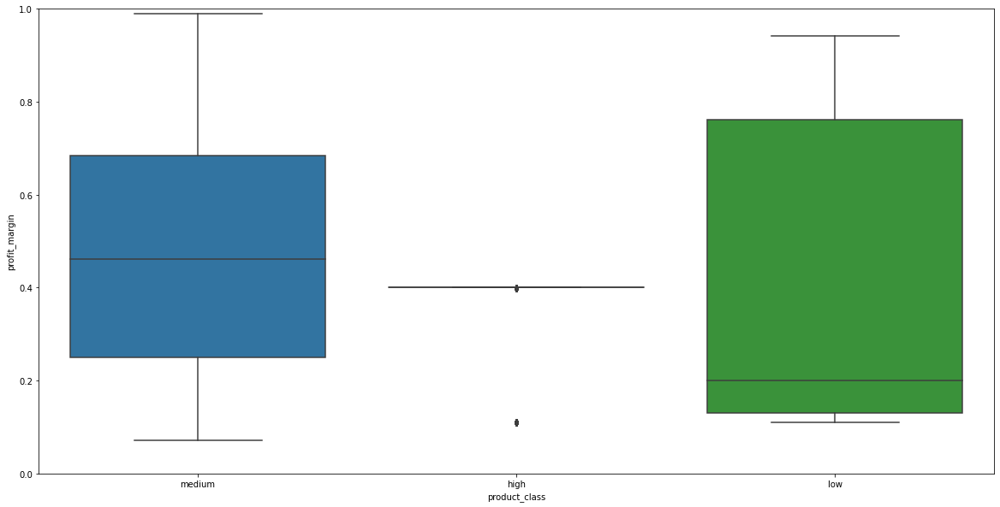

In [76]:
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='product_class',y='profit_margin',data=transactions,order=bikes_class_counts_average_list_profit_profit_margins.index)
ax.set_ylim(0,1);

In [77]:
customer_product_class_dummies=pd.get_dummies(transactions['product_class'])
customer_product_class_dummies=pd.merge(left=customer_product_class_dummies,right=transactions['transaction_date'],left_index=True,right_index=True)
customer_product_class_dummies=customer_product_class_dummies.set_index('transaction_date').resample('M').sum()
customer_product_class_dummies.index=customer_product_class_dummies.index.strftime('%B')
customer_product_class_dummies

,high,low,medium
transaction_date,,,
January,231.0,229.0,1205.0
February,267.0,248.0,1097.0
March,250.0,232.0,1147.0
April,237.0,285.0,1119.0
May,263.0,269.0,1134.0
June,251.0,222.0,1091.0
July,248.0,249.0,1203.0
August,287.0,259.0,1189.0
September,251.0,233.0,1075.0


In [78]:
fig = go.Figure()
for i in range(len(customer_product_class_dummies.columns)):
    fig.add_trace(go.Scatter(x=customer_product_class_dummies.index, y=customer_product_class_dummies[customer_product_class_dummies.columns[i]],name=customer_product_class_dummies.columns[i]))

fig.update_xaxes(title_text="Transaction Month")
fig.update_yaxes(title_text="Number of Transactions")
fig.show()

In [79]:
bikes_class_counts_average_list_profit_profit_margins.columns=['products_sold','average_list_price','average_product_profit','average_profit_margin']

In [80]:
bikes_class_counts_average_list_profit_profit_margins.describe()

,products_sold,average_list_price,average_product_profit,average_profit_margin
count,3.000000,3.000000,3.000000,3.000000
mean,6601.000000,1056.507746,466.477241,0.404423
std,6257.081508,115.424584,136.526481,0.065966
min,2964.000000,927.577392,370.303886,0.363596
25%,2988.500000,1009.650201,388.344868,0.366371
50%,3013.000000,1091.723010,406.385850,0.369146
75%,8419.500000,1120.972923,514.563918,0.424836
max,13826.000000,1150.222835,622.741986,0.480527


Analyze by 'product line'

In [81]:
transactions_line_brand_count=pd.DataFrame(transactions.groupby(['product_line','brand','product_class'])['product_id'].count().sort_index(ascending=False))
transactions_line_brand_mean_profit=pd.DataFrame(transactions.groupby(['product_line','brand','product_class'])['profit_margin'].mean().sort_index(ascending=False))
transactions_line_brand_profit_average=pd.DataFrame(transactions.groupby(['product_line','brand','product_class'])['product_profit'].mean().sort_index(ascending=False))
transactions_line_brand_cost=pd.DataFrame(transactions.groupby(['product_line','brand','product_class'])['list_price'].mean().sort_index(ascending=False))

In [82]:
transactions_line_brand_count_cost=pd.merge(transactions_line_brand_count,transactions_line_brand_cost,left_index=True,right_index=True)
transactions_line_brand_count_cost_profit=pd.merge(transactions_line_brand_count_cost,transactions_line_brand_profit_average,left_index=True,right_index=True)
transactions_line_brand_count_cost_profit_margins=pd.merge(transactions_line_brand_count_cost_profit,transactions_line_brand_mean_profit,left_index=True,right_index=True)
transactions_line_brand_count_cost_profit_margins.columns=['products_sold','average_list_price','average_product_profit','average_profit_margin']
transactions_line_brand_count_cost_profit_margins

products_sold  average_list_price  \
product_line brand          product_class                                      
Touring      WeareA2B       medium                   618         1593.374984   
             Solex          medium                   208         2083.940000   
             OHM Cycles     low                      229         1073.070000   
             Giant Bicycles medium                   179         1873.970000   
Standard     WeareA2B       medium                  2346         1228.682639   
                            low                      174          642.310000   
             Trek Bicycles  medium                  1254         1577.122392   
                            low                      193         1057.510000   
                            high                     325          436.139908   
             Solex          medium                  2532          875.690612   
                            low                      410         1099.784000   
                            high                     566         1208.480247   
             OHM Cycles     medium                  1079          826.399425   
                            low                      380         1054.666816   
                            high                     576         1218.694132   
             Norco Bicycles medium                   980          977.363235   
                            low                      432          653.979977   
                            high                     375         1399.120640   
             Giant Bicycles medium                  1769         1197.763499   
                            high                     785         1384.332357   
Road         WeareA2B       low                      157         1172.780000   
             Trek Bicycles  medium                   625          959.933744   
                            low                      370         1318.520730   
             Solex          medium                   537         1323.944544   
             OHM Cycles     medium                   584         1285.820514   
                            high                     195           12.010000   
             Norco Bicycles medium                   732          828.896639   
                            high                     191          774.530000   
             Giant Bicycles medium                   383         1135.750757   
                            low                      196          590.260000   
Mountain     Trek Bicycles  low                      223          574.640000   
             Norco Bicycles low                      200          688.630000   

                                           average_product_profit  \
product_line brand          product_class                           
Touring      WeareA2B       medium                    1366.387282   
             Solex          medium                    1408.910000   
             OHM Cycles     low                        139.230000   
             Giant Bicycles medium                    1010.020000   
Standard     WeareA2B       medium                     795.763521   
                            low                        128.460000   
             Trek Bicycles  medium                     846.519378   
                            low                        903.110000   
                            high                       174.458831   
             Solex          medium                     512.358416   
                            low                        786.557366   
                            high                       483.392085   
             OHM Cycles     medium                     640.187729   
                            low                        888.157526   
                            high                       487.476389   
             Norco Bicycles medium                     365.649480   
                            low                        139.631574   
           

Analyze by total products sold - most to least

In [83]:
transactions_line_brand_count_cost_profit_margins.columns=['products_sold','average_list_price','average_product_profit','average_profit_margin']
transactions_line_brand_count_cost_profit_margins = transactions_line_brand_count_cost_profit_margins.sort_values('products_sold',ascending=False)

Analyze Profit Margins - from least to most

In [84]:
# Looking to see how profitability interacts with product sales [count]
transactions_line_brand_count_cost_profit_margins.sort_values('average_profit_margin')

products_sold  average_list_price  \
product_line brand          product_class                                      
Mountain     Norco Bicycles low                      200          688.630000   
Road         Giant Bicycles low                      196          590.260000   
             WeareA2B       low                      157         1172.780000   
Touring      OHM Cycles     low                      229         1073.070000   
Road         OHM Cycles     medium                   584         1285.820514   
Standard     WeareA2B       low                      174          642.310000   
Mountain     Trek Bicycles  low                      223          574.640000   
Standard     Norco Bicycles low                      432          653.979977   
                            high                     375         1399.120640   
Road         Solex          medium                   537         1323.944544   
Standard     Norco Bicycles medium                   980          977.363235   
             Giant Bicycles high                     785         1384.332357   
Road         Giant Bicycles medium                   383         1135.750757   
Standard     Giant Bicycles medium                  1769         1197.763499   
Road         Norco Bicycles medium                   732          828.896639   
             OHM Cycles     high                     195           12.010000   
Standard     OHM Cycles     high                     576         1218.694132   
Road         Norco Bicycles high                     191          774.530000   
Standard     Solex          high                     566         1208.480247   
             Trek Bicycles  high                     325          436.139908   
Road         Trek Bicycles  medium                   625          959.933744   
                            low                      370         1318.520730   
Standard     Trek Bicycles  medium                  1254         1577.122392   
             Solex          medium                  2532          875.690612   
Touring      Giant Bicycles medium                   179         1873.970000   
Standard     OHM Cycles     low                      380         1054.666816   
             WeareA2B       medium                  2346         1228.682639   
             OHM Cycles     medium                  1079          826.399425   
Touring      Solex          medium                   208         2083.940000   
Standard     Solex          low                      410         1099.784000   
             Trek Bicycles  low                      193         1057.510000   
Touring      WeareA2B       medium                   618         1593.374984   

                                           average_product_profit  \
product_line brand          product_class                           
Mountain     Norco Bicycles low                         75.750000   
Road         Giant Bicycles low                         64.930000   
             WeareA2B       low                        129.010000   
Touring      OHM Cycles     low                        139.230000   
Road         OHM Cycles     medium                     241.730051   
Standard     WeareA2B       low                        128.460000   
Mountain     Trek Bicycles  low                        114.930000   
Standard     Norco Bicycles low                        139.631574   
                            high                       324.454800   
Road         Solex          medium                     423.497905   
Standard     Norco Bicycles medium                     365.649480   
             Giant Bicycles high                       411.286510   
Road         Giant Bicycles medium                     433.094987   
Standard     Giant Bicycles medium                     504.005218   
Road         Norco Bicycles medium                     345.672377   
             OHM Cycles     high                         4.800000   
Standard     OHM Cycles     high                       487.476389   
Road       

In [85]:
transactions_line_table = transactions_line_brand_count_cost_profit_margins.sort_values('products_sold', ascending=False)
transactions_line_table.columns = transactions_line_table.columns.str.replace('_',' ')
transactions_line_table.columns = transactions_line_table.columns.str.title()
transactions_line_table = round(transactions_line_table, 2)
transactions_line_table

Products Sold  Average List Price  \
product_line brand          product_class                                      
Standard     Solex          medium                  2532              875.69   
             WeareA2B       medium                  2346             1228.68   
             Giant Bicycles medium                  1769             1197.76   
             Trek Bicycles  medium                  1254             1577.12   
             OHM Cycles     medium                  1079              826.40   
             Norco Bicycles medium                   980              977.36   
             Giant Bicycles high                     785             1384.33   
Road         Norco Bicycles medium                   732              828.90   
             Trek Bicycles  medium                   625              959.93   
Touring      WeareA2B       medium                   618             1593.37   
Road         OHM Cycles     medium                   584             1285.82   
Standard     OHM Cycles     high                     576             1218.69   
             Solex          high                     566             1208.48   
Road         Solex          medium                   537             1323.94   
Standard     Norco Bicycles low                      432              653.98   
             Solex          low                      410             1099.78   
Road         Giant Bicycles medium                   383             1135.75   
Standard     OHM Cycles     low                      380             1054.67   
             Norco Bicycles high                     375             1399.12   
Road         Trek Bicycles  low                      370             1318.52   
Standard     Trek Bicycles  high                     325              436.14   
Touring      OHM Cycles     low                      229             1073.07   
Mountain     Trek Bicycles  low                      223              574.64   
Touring      Solex          medium                   208             2083.94   
Mountain     Norco Bicycles low                      200              688.63   
Road         Giant Bicycles low                      196              590.26   
             OHM Cycles     high                     195               12.01   
Standard     Trek Bicycles  low                      193             1057.51   
Road         Norco Bicycles high                     191              774.53   
Touring      Giant Bicycles medium                   179             1873.97   
Standard     WeareA2B       low                      174              642.31   
Road         WeareA2B       low                      157             1172.78   

                                           Average Product Profit  \
product_line brand          product_class                           
Standard     Solex          medium                         512.36   
             WeareA2B       medium                         795.76   
             Giant Bicycles medium                         504.01   
             Trek Bicycles  medium                         846.52   
             OHM Cycles     medium                         640.19   
             Norco Bicycles medium                         365.65   
             Giant Bicycles high                           411.29   
Road         Norco Bicycles medium                         345.67   
             Trek Bicycles  medium                         540.62   
Touring      WeareA2B       medium                        1366.39   
Road         OHM Cycles     medium                         241.73   
Standard     OHM Cycles     high                           487.48   
             Solex          high                           483.39   
Road         Solex          medium                         423.50   
Standard     Norco Bicycles low                            139.63   
             Solex          low                            786.56   
Road         Giant Bicycles medium                         433.09   
Standard   

In [86]:
# transactions_by_brand_by_line=transactions.set_index(['brand','product_line','product_id']).sort_index().to_csv('transactions_by_brand_by_line.csv')

In [87]:
# Number of prices per product_id
pd.DataFrame(transactions.groupby(['product_id'])['list_price'].nunique().sort_values(ascending=False)).values.T

array([[25,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  1,  1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
         1,  1,  1,  1,  1]], dtype=int64)

In [88]:
pd.DataFrame(transactions.groupby(['product_id'])['list_price'].nunique().value_counts())

,list_price
2,76
1,24
25,1


In [89]:
transactions.head(5)

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,17.87,0.249965
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,1702.55,0.814045
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,1544.61,0.861260
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,817.36,0.682009
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,1055.82,0.598097


In [90]:
transactions.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date', 'product_profit', 'profit_margin'],
      dtype='object')

In [91]:
# Frequency of products sold by product ID
pd.DataFrame(transactions.groupby(['product_id'])['transaction_id'].count().sort_values(ascending=False)).T

product_id,0,3,1,35,38,4,2,90,12,80,...,97,24,73,75,44,71,8,16,100,47
transaction_id,1181,354,311,268,267,241,240,225,224,223,...,142,141,139,138,138,137,136,136,130,121


In [92]:
# Frequency of number of transactions by customer ID
customer_transaction_count=pd.DataFrame(transactions.groupby(['customer_id'])['transaction_date'].count().sort_values(ascending=False))
customer_transaction_count.columns=['bike_purchases']
customer_transaction_count
# Add to customer dataset

,bike_purchases
customer_id,
2476,14
1068,14
2183,14
3232,13
1946,13
...,...
2863,1
191,1
1448,1


In [93]:
customer_transaction_count.sort_values('customer_id')

,bike_purchases
customer_id,
1,11
2,3
3,8
4,2
5,6
...,...
3497,3
3498,6
3499,7


In [94]:
# Frequency of products bought by customers by date
pd.DataFrame(transactions.groupby(['transaction_date','customer_id'])['product_id'].count()).head(30)

product_id
transaction_date customer_id            
2017-01-01       51                    1
                 113                   1
                 123                   1
                 138                   1
                 234                   1
                 311                   1
                 366                   1
                 462                   1
                 467                   1
                 523                   1
                 642                   1
                 671                   1
                 722                   1
                 769                   1
                 824                   1
                 871                   1
                 1022                  1
                 1099                  1
                 1229                  1
                 1349                  1
                 1658                  1
                 1691                  1
                 1707                  1
                 1745                  2
                 1762                  1
                 1852                  1
                 1931                  1
                 1935                  1
                 2011                  1
                 2068                  1

In [95]:
pd.DataFrame(transactions.groupby(['customer_id','transaction_date'])['product_id'].count().value_counts())

,product_id
1,19545
2,129


While customers vary greatly in overall purchases, most customers seem to purchase only 1 product at a time

Seems like there is a 1-to-1 relationship between transactions and product IDs - one product per purchase?

Making it difficult to analyze co-purchases

In [96]:
transactions_value_counts=[pd.DataFrame(transactions[transactions.columns[i]].value_counts()).T for i in range(len(transactions.columns))]
transactions_value_counts

[                2047   19084  8833   14978  12931  2692   645    6790   4743   \
 transaction_id      1      1      1      1      1      1      1      1      1   
 
                 17037  ...  3371   13612  15661  9518   11567  17714  19763  \
 transaction_id      1  ...      1      1      1      1      1      1      1   
 
                 5432   7481   2049   
 transaction_id      1      1      1  
 
 [1 rows x 19803 columns],
              0    3    1    35   38   4    2    90   12   80   ...  97   24   \
 product_id  1181  354  311  268  267  241  240  225  224  223  ...  142  141   
 
             73   44   75   71   8    16   100  47   
 product_id  139  138  138  137  136  136  130  121  
 
 [1 rows x 101 columns],
              1068  2183  2476  2548  1913  2912  3232  2072  3048  1129  ...  \
 customer_id    14    14    14    13    13    13    13    13    13    13  ...   
 
              3161  1448  2291  2532  1544  373   2876  2328  1921  3279  
 customer_id     1     1   

In [97]:
transactions.loc[transactions['product_id']==0]

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
34,35,0,2171,2017-08-20,0.0,Approved,Norco Bicycles,Road,medium,medium,544.05,376.84,38647.0,167.21,0.307343
39,40,0,2448,2017-11-28,1.0,Approved,Norco Bicycles,Road,medium,medium,544.05,376.84,38647.0,167.21,0.307343
54,55,0,3140,2017-09-18,0.0,Approved,Norco Bicycles,Standard,low,medium,363.01,290.41,38482.0,72.60,0.199994
60,61,0,1839,2017-02-24,0.0,Approved,OHM Cycles,Road,high,large,12.01,7.21,34244.0,4.80,0.399667
63,64,0,2000,2017-07-08,0.0,Approved,Trek Bicycles,Standard,medium,medium,499.53,388.72,39031.0,110.81,0.221829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19921,19922,0,1869,2017-01-06,1.0,Approved,Norco Bicycles,Road,medium,medium,543.39,407.54,37698.0,135.85,0.250005
19941,19942,0,966,2017-07-30,1.0,Approved,OHM Cycles,Standard,low,medium,71.16,56.93,38647.0,14.23,0.199972
19967,19968,0,2751,2017-04-06,0.0,Approved,WeareA2B,Standard,medium,medium,60.34,45.26,34165.0,15.08,0.249917
19987,19988,0,13,2017-04-05,1.0,Approved,Norco Bicycles,Road,medium,medium,544.05,376.84,42105.0,167.21,0.307343


In [98]:
new_customer_list=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='NewCustomerList',skiprows=1).reset_index()
new_customer_list.to_csv('new_customer_list.csv')
new_customer_list.head()

,index,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,...,QLD,Australia,6,0.56,0.7000,0.8750,0.743750,1,1,1.718750
1,1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,...,NSW,Australia,11,0.89,0.8900,1.1125,0.945625,1,1,1.718750
2,2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,...,VIC,Australia,5,1.01,1.0100,1.0100,1.010000,1,1,1.718750
3,3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,...,QLD,Australia,1,0.87,1.0875,1.0875,1.087500,4,4,1.703125
4,4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,...,NSW,Australia,9,0.52,0.5200,0.6500,0.650000,4,4,1.703125


In [99]:
# Calculate order total for each transaction and graph distribution on histogram chart

In [100]:
new_customer_list.shape

(1000, 24)

In [101]:
new_customer_list.count()

index                                  1000
first_name                             1000
last_name                               971
gender                                 1000
past_3_years_bike_related_purchases    1000
DOB                                     983
job_title                               894
job_industry_category                   835
wealth_segment                         1000
deceased_indicator                     1000
owns_car                               1000
tenure                                 1000
address                                1000
postcode                               1000
state                                  1000
country                                1000
property_valuation                     1000
Unnamed: 16                            1000
Unnamed: 17                            1000
Unnamed: 18                            1000
Unnamed: 19                            1000
Unnamed: 20                            1000
Rank                            

In [102]:
# Number of complete columns
len((new_customer_list.columns[~new_customer_list.isna().any()])) / len(new_customer_list.columns)

0.8333333333333334

In [103]:
# Complete data in 'DOB column'
new_customer_list['DOB'].count() / len(new_customer_list)

0.983

In [104]:
# Overall data that is complete
new_customer_list.count().sum() / (new_customer_list.shape[0] * new_customer_list.shape[1])

0.9867916666666666

In [105]:
new_customer_list[new_customer_list.duplicated(['first_name','last_name'])]

,index,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value


In [106]:
new_customer_list.dropna(subset=['DOB'],inplace=True)

In [107]:
new_customer_list=new_customer_list.fillna('N/A')

In [108]:
new_customer_list.count()

index                                  983
first_name                             983
last_name                              983
gender                                 983
past_3_years_bike_related_purchases    983
DOB                                    983
job_title                              983
job_industry_category                  983
wealth_segment                         983
deceased_indicator                     983
owns_car                               983
tenure                                 983
address                                983
postcode                               983
state                                  983
country                                983
property_valuation                     983
Unnamed: 16                            983
Unnamed: 17                            983
Unnamed: 18                            983
Unnamed: 19                            983
Unnamed: 20                            983
Rank                                   983
Value      

In [109]:
new_customer_list.describe()

,index,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
count,983.000000,983.000000,983.000000,983.00000,983.000000,983.000000,983.000000,983.000000,983.000000,983.000000,983.000000,983.000000
mean,498.431333,49.824008,11.459817,3017.74059,7.406918,0.746399,0.838222,0.942255,0.870194,497.745677,497.745677,0.882926
std,289.197645,27.786108,5.006123,849.38176,2.758293,0.205207,0.249030,0.294791,0.280881,289.186799,289.186799,0.294166
min,0.000000,0.000000,1.000000,2000.00000,1.000000,0.400000,0.400000,0.400000,0.340000,1.000000,1.000000,0.340000
25%,247.500000,27.000000,8.000000,2209.00000,6.000000,0.570000,0.630000,0.712500,0.659375,248.500000,248.500000,0.650781
50%,499.000000,51.000000,11.000000,2795.00000,8.000000,0.750000,0.820000,0.912500,0.841500,500.000000,500.000000,0.860000
75%,747.500000,72.000000,15.000000,3850.50000,9.000000,0.920000,1.030000,1.140625,1.062500,748.000000,748.000000,1.076953
max,999.000000,99.000000,22.000000,4879.00000,12.000000,1.100000,1.375000,1.718750,1.718750,1000.000000,1000.000000,1.718750


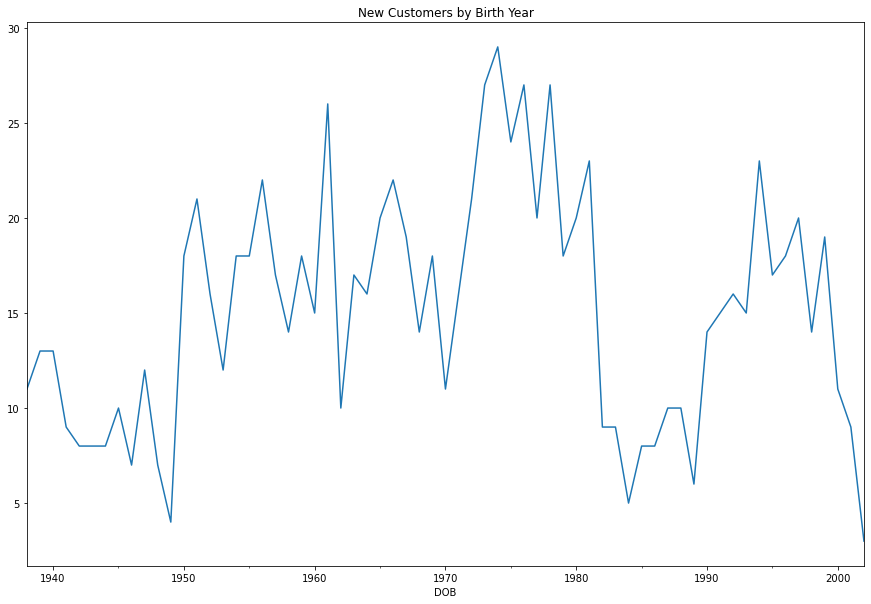

In [110]:
new_customer_by_year=new_customer_list.set_index('DOB')['index'].resample('Y').nunique()
new_customer_by_year_plot=new_customer_by_year.plot(figsize=(15,10)).set_title('New Customers by Birth Year')
new_customer_by_year_plot;

In [111]:
new_customer_by_year

DOB
1938-12-31    11
1939-12-31    13
1940-12-31    13
1941-12-31     9
1942-12-31     8
              ..
1998-12-31    14
1999-12-31    19
2000-12-31    11
2001-12-31     9
2002-12-31     3
Freq: A-DEC, Name: index, Length: 65, dtype: int64

In [112]:
new_customer_by_year.index=new_customer_by_year.index.year

In [113]:
len(new_customer_by_year.values)

65

In [114]:
new_customer_by_year_plot.figure.savefig('New Customers by Birth Year.png')

In [115]:
new_customer_by_year

DOB
1938    11
1939    13
1940    13
1941     9
1942     8
        ..
1998    14
1999    19
2000    11
2001     9
2002     3
Name: index, Length: 65, dtype: int64

In [116]:
new_customer_dummies=pd.get_dummies(new_customer_list[['wealth_segment']])
new_customer_list_dummies=pd.concat([new_customer_list['DOB'],new_customer_dummies],axis=1)
new_customer_by_year_by_wealth=new_customer_list_dummies.groupby(new_customer_list_dummies.set_index('DOB').index.year).sum()

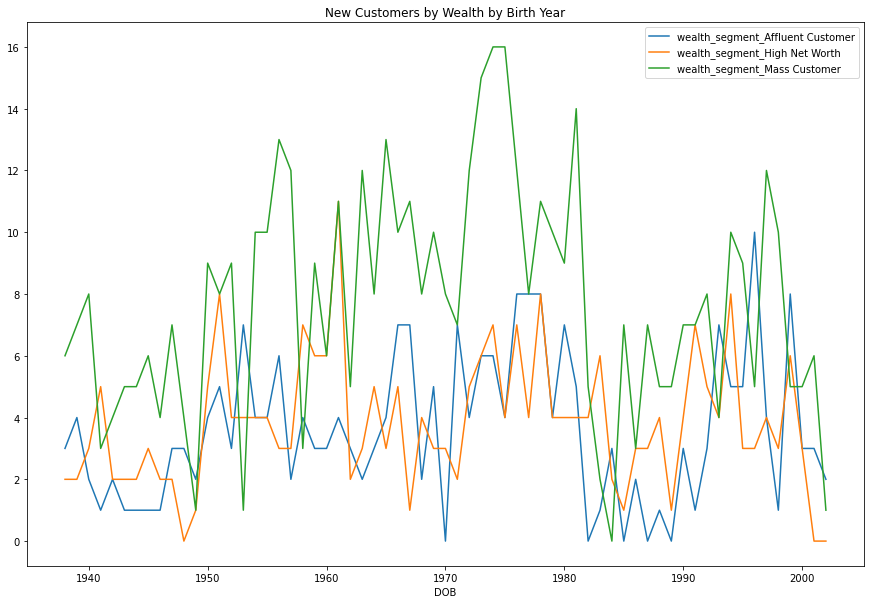

In [117]:
new_customer_by_year_by_wealth_plot=new_customer_by_year_by_wealth.plot(figsize=(15,10)).set_title('New Customers by Wealth by Birth Year')
new_customer_by_year_by_wealth_plot;

In [118]:
new_customer_by_year_by_wealth_plot.figure.savefig('New Customers by Wealth by Birth Year.png')

In [119]:
new_customer_by_year_by_wealth.head()

,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
DOB,,,
1938,3,2,6
1939,4,2,7
1940,2,3,8
1941,1,5,3
1942,2,2,4


In [120]:
new_customer_value_counts=[pd.DataFrame(new_customer_list[new_customer_list.columns[i]].value_counts()).T for i in range(len(new_customer_list.columns))]
new_customer_value_counts

[       999  339  337  336  335  334  333  332  331  330  ...  666  665  663  \
 index    1    1    1    1    1    1    1    1    1    1  ...    1    1    1   
 
        662  661  660  659  658  657  0    
 index    1    1    1    1    1    1    1  
 
 [1 rows x 983 columns],
             Dorian  Mandie  Worthington  Ricki  Farlie  Suzy  Cissiee  \
 first_name       3       3            2      2       2     2        2   
 
             Marcelia  Cami  Meade  ...  Chickie  Symon  Delcina  Dory  Loleta  \
 first_name         2     2      2  ...        1      1        1     1       1   
 
             Bambi  Nora  Clarine  Teddie  Calida  
 first_name      1     1        1       1       1  
 
 [1 rows x 925 columns],
            N/A  Shoesmith  Burgoine  Sturch  Hallt  Crellim  Sissel  Eade  \
 last_name   29          2         2       2      2        2       2     2   
 
            Borsi  Minshall  ...  Gabbitas  Prewer  Casper  Dwelley  \
 last_name      2         2  ...         1     

In [121]:
customer_demographic=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='CustomerDemographic',skiprows=1)
customer_demographic.to_csv('customer_demographic.csv') # Remove extra column created
customer_demographic.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,<script>alert('hi')</script>,Yes,16.0
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,2018-02-01 00:00:00,Yes,15.0
3,4,Talbot,NaN,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,NIL,Yes,8.0


In [122]:
customer_demographic.shape

(4000, 13)

In [123]:
customer_demographic.count()

customer_id                            4000
first_name                             4000
last_name                              3875
gender                                 4000
past_3_years_bike_related_purchases    4000
DOB                                    3913
job_title                              3494
job_industry_category                  3344
wealth_segment                         4000
deceased_indicator                     4000
default                                3698
owns_car                               4000
tenure                                 3913
dtype: int64

In [124]:
# Default has missing values, but it seems to be a irrelevant column either way

In [125]:
# How many rows are completely filled
customer_demographic_complete_rows_count=len(customer_demographic.columns[customer_demographic.count() == customer_demographic.shape[0]])
customer_demographic_complete_rows_count / len(customer_demographic.count())

0.5384615384615384

In [126]:
# How much overall data is filled
customer_demographic.count().sum() / (customer_demographic.shape[0] * customer_demographic.shape[1])

0.9660961538461539

In [127]:
customer_demographic.drop(columns='default',inplace=True)

In [128]:
customer_demographic.dropna(subset=['DOB'],inplace=True)

In [129]:
customer_demographic[(customer_demographic.DOB.dt.year < 1900)]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure
33,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0


In [130]:
customer_demographic=customer_demographic.fillna('N/A').drop(33).reset_index(drop=True)

In [131]:
customer_demographic.count()

customer_id                            3912
first_name                             3912
last_name                              3912
gender                                 3912
past_3_years_bike_related_purchases    3912
DOB                                    3912
job_title                              3912
job_industry_category                  3912
wealth_segment                         3912
deceased_indicator                     3912
owns_car                               3912
tenure                                 3912
dtype: int64

In [132]:
customer_demographic[customer_demographic.duplicated(['first_name','last_name'])]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure
1864,1905,Corabelle,N/A,Female,21,1953-09-17,Help Desk Technician,Manufacturing,Affluent Customer,N,No,15.0


In [133]:
customer_demographic.describe()

,customer_id,past_3_years_bike_related_purchases,tenure
count,3912.000000,3912.000000,3912.000000
mean,1999.828221,49.039366,10.654652
std,1154.903377,28.768226,5.658898
min,1.000000,0.000000,1.000000
25%,1002.750000,24.000000,6.000000
50%,2000.000000,48.000000,11.000000
75%,2997.250000,73.000000,15.000000
max,4000.000000,99.000000,22.000000


In [134]:
customer_demographic.dtypes

customer_id                                     int64
first_name                                     object
last_name                                      object
gender                                         object
past_3_years_bike_related_purchases             int64
DOB                                    datetime64[ns]
job_title                                      object
job_industry_category                          object
wealth_segment                                 object
deceased_indicator                             object
owns_car                                       object
tenure                                        float64
dtype: object

In [135]:
new_customer_by_year

DOB
1938    11
1939    13
1940    13
1941     9
1942     8
        ..
1998    14
1999    19
2000    11
2001     9
2002     3
Name: index, Length: 65, dtype: int64

In [136]:
df_new_customer_by_year=pd.DataFrame(new_customer_by_year)

In [137]:
new_customer_by_year.sum()

983

In [138]:
yearly_customer_demographic=customer_demographic.set_index('DOB')['customer_id'].resample('Y').count()
yearly_customer_demographic

DOB
1931-12-31     1
1932-12-31     0
1933-12-31     0
1934-12-31     0
1935-12-31     1
              ..
1998-12-31    80
1999-12-31    60
2000-12-31    42
2001-12-31    34
2002-12-31     6
Freq: A-DEC, Name: customer_id, Length: 72, dtype: int64

In [139]:
df_yearly_customer_demographic=pd.DataFrame(yearly_customer_demographic)

In [140]:
yearly_customer_demographic.sum()

3912

In [141]:
yearly_customer_demographic.values # y

array([  1,   0,   0,   0,   1,   0,   0,   0,   0,   1,   0,   0,   1,
         1,   0,   0,   0,   0,   0,   0,   0,   0,  19,  61,  58,  63,
        71,  55,  94,  58,  60,  76,  59,  85,  69,  65,  73,  69,  78,
        57,  88,  54, 122, 152, 114, 152, 204, 217, 118, 123,  79,  41,
        40,  43,  91, 114,  72,  72,  74,  53,  48,  74,  60,  79,  90,
        67,  74,  80,  60,  42,  34,   6], dtype=int64)

In [142]:
df_yearly_customer_demographic.index=df_yearly_customer_demographic.index.year # x

In [143]:
all_customers_by_DOB=df_new_customer_by_year.merge(df_yearly_customer_demographic,left_index=True,right_index=True,how='right').fillna(0).astype('int')
all_customers_by_DOB.columns=['New Customers','Customers']
all_customers_by_DOB.index=all_customers_by_DOB.index
all_customers_by_DOB

,New Customers,Customers
DOB,,
1931,0,1
1932,0,0
1933,0,0
1934,0,0
1935,0,1
...,...,...
1998,14,80
1999,19,60
2000,11,42


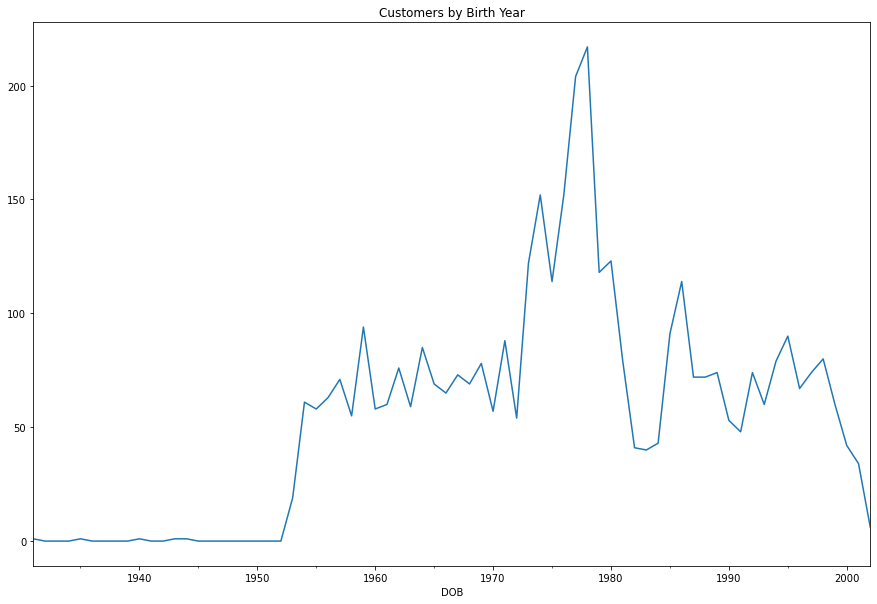

In [144]:
yearly_customer_demographic.plot(figsize=(15,10)).set_title('Customers by Birth Year');

There seems to be an outlier in our customer date range, otherwise the data looks good

In [145]:
yearly_customer_demographic.head()

DOB
1931-12-31    1
1932-12-31    0
1933-12-31    0
1934-12-31    0
1935-12-31    1
Freq: A-DEC, Name: customer_id, dtype: int64

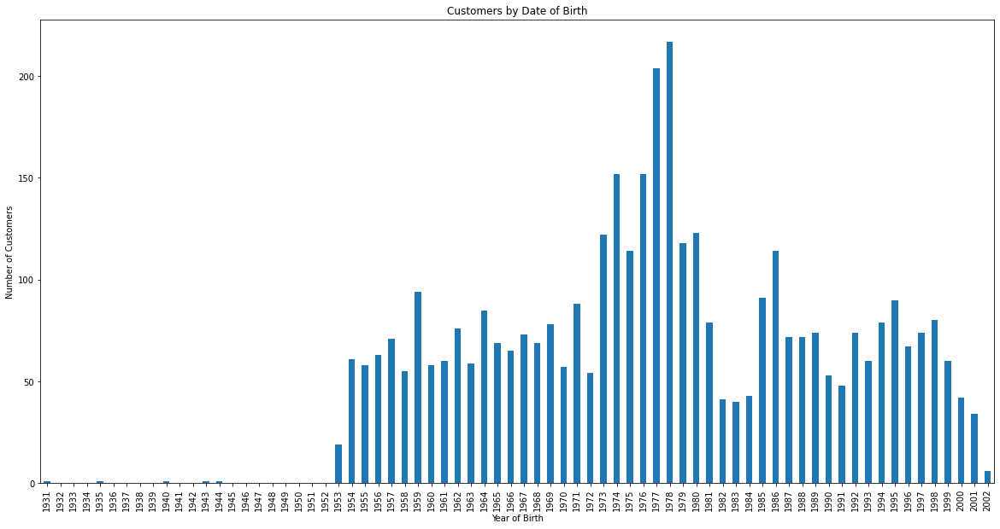

In [393]:
customers_DOB_plot = all_customers_by_DOB['Customers'].plot.bar(figsize=(20,10))
plt.title('Customers by Date of Birth')
plt.xlabel('Year of Birth')
plt.ylabel('Number of Customers')
plt.show()

In [394]:
customers_DOB_plot.figure.savefig('Customers by DOB.png')

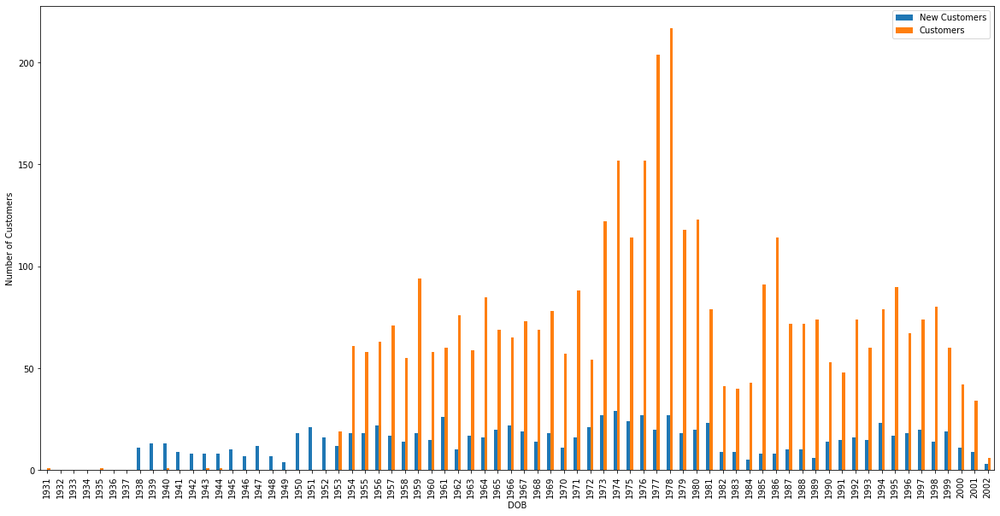

In [147]:
all_customers_by_DOB.plot.bar(figsize=(20,10))
plt.ylabel('Number of Customers')
plt.show()

In [148]:
reshaped_all_customers_by_DOB=all_customers_by_DOB
reshaped_all_customers_by_DOB['New Customers']=reshaped_all_customers_by_DOB['New Customers']*4

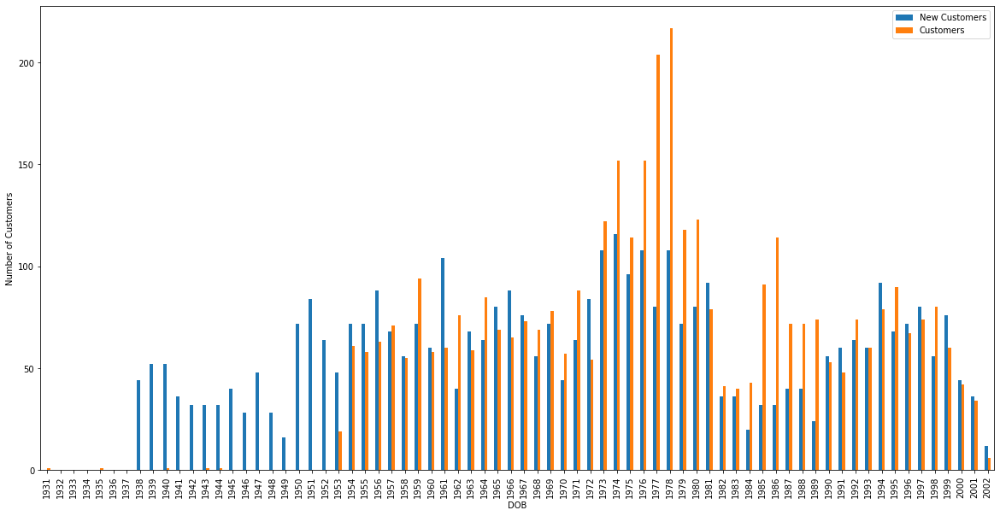

In [149]:
reshaped_all_customers_by_DOB.plot.bar(figsize=[20,10])
plt.ylabel('Number of Customers')
plt.show();

In [150]:
# Resetting all_customers_by_DOB - not sure why it works
reshaped_all_customers_by_DOB['New Customers']=reshaped_all_customers_by_DOB['New Customers']/4

In [151]:
all_customers_by_DOB

,New Customers,Customers
DOB,,
1931,0.0,1
1932,0.0,0
1933,0.0,0
1934,0.0,0
1935,0.0,1
...,...,...
1998,14.0,80
1999,19.0,60
2000,11.0,42


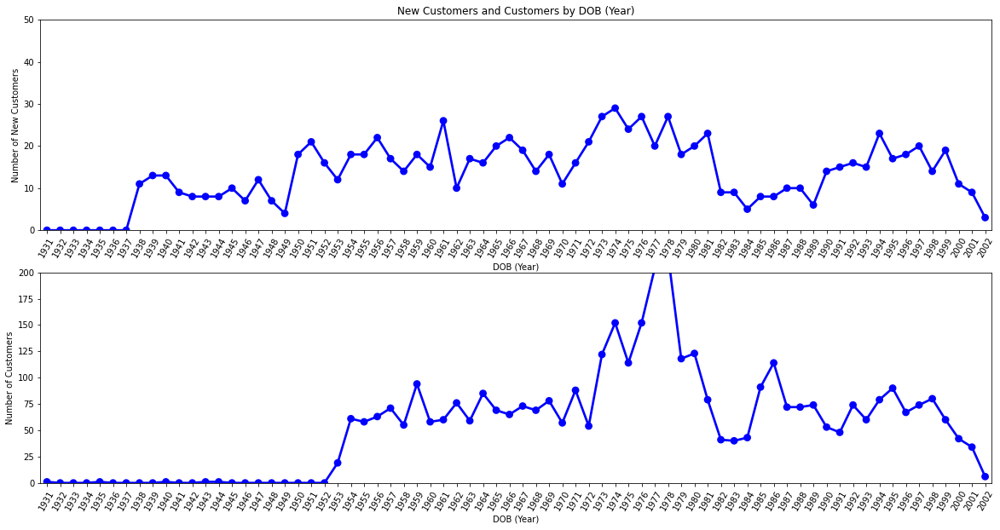

In [152]:
# Set up the matplotlib figure
f, axes = plt.subplots(2, 1, figsize=(20, 10))

sns.pointplot(x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],color='blue',ax=axes[0])
sns.pointplot(x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],color='blue',ax=axes[1])

axes[0].set_title('New Customers and Customers by DOB (Year)')
axes[0].set_xlabel('DOB (Year)')
axes[0].set_ylabel("Number of New Customers")
axes[0].set_xticklabels(all_customers_by_DOB.index,rotation=60)
axes[0].set_ylim(0,50)

axes[1].set_xlabel('DOB (Year)')
axes[1].set_ylabel("Number of Customers")
axes[1].set_xticklabels(all_customers_by_DOB.index,rotation=60)
axes[1].set_ylim(0,200)

plt.show();

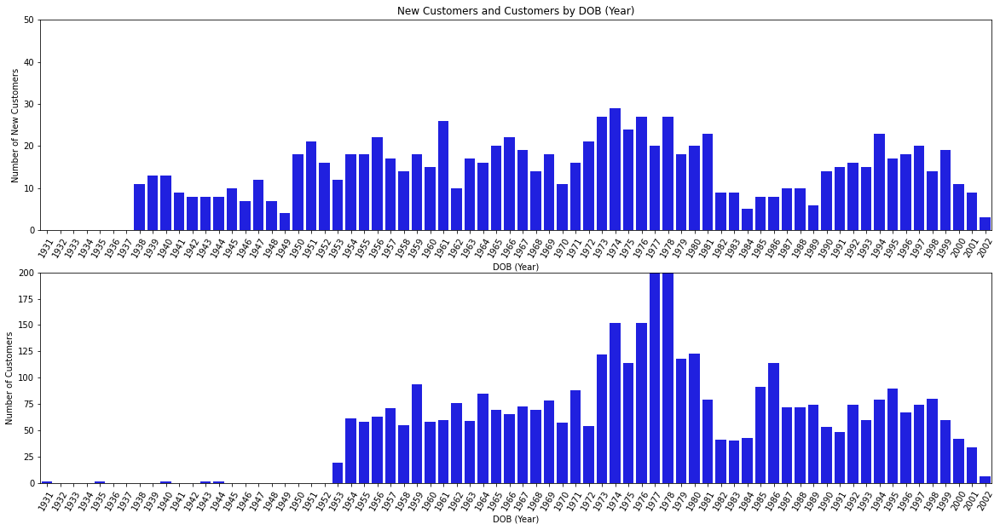

In [153]:
# Set up the matplotlib figure
f, axes = plt.subplots(2, 1, figsize=(20, 10))

sns.barplot(x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],color='blue',ax=axes[0])
sns.barplot(x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],color='blue',ax=axes[1])

axes[0].set_title('New Customers and Customers by DOB (Year)')
axes[0].set_xlabel('DOB (Year)')
axes[0].set_ylabel("Number of New Customers")
axes[0].set_xticklabels(all_customers_by_DOB.index,rotation=60)
axes[0].set_ylim(0,50)

axes[1].set_xlabel('DOB (Year)')
axes[1].set_ylabel("Number of Customers")
axes[1].set_xticklabels(all_customers_by_DOB.index,rotation=60)
axes[1].set_ylim(0,200)

plt.show();

In [154]:
fig = make_subplots(rows=2, cols=1,
                   subplot_titles=('New Customers by DOB','Customers by DOB'))

fig.add_trace(
    go.Scatter(mode='markers',x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],name='New Customers'),
    row=1, col=1
)
fig.update_xaxes(title_text="Customer DOB (Year)", range=[all_customers_by_DOB.index[0], all_customers_by_DOB.index[~0]], row=1, col=1)
fig.update_yaxes(title_text="Number of Customers", range=[0, 50], row=1, col=1)

fig.add_trace(
    go.Scatter(mode='markers',x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],name='Customers'),
    row=2, col=1
)
fig.update_xaxes(title_text="Customer DOB (Year)", range=[all_customers_by_DOB.index[0], all_customers_by_DOB.index[~0]], row=2, col=1)
fig.update_yaxes(title_text="Number of Customers", range=[0, 200], row=2, col=1)

fig.update_layout(height=800, width=900, title_text="DOBs (Year) of New Customers vs Customers")
fig.show()

In [155]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(mode='markers',x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],name='New Customers'),secondary_y=False)
fig.add_trace(go.Scatter(mode='markers',x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],name='Customers'),secondary_y=True)

fig.update_layout(height=600, width=900, title_text="DOBs (Year) of New Customers vs Customers")
fig.update_yaxes(title_text="Number of New Customers", range=[0, 50], secondary_y=False,dtick=10)
fig.update_yaxes(title_text="Number of Customers", range=[0, 200],secondary_y=True,dtick=40)
fig.update_xaxes(title_text="Customer DOB (Year)", range=[all_customers_by_DOB.index[0], all_customers_by_DOB.index[~0]])

fig.show();

In [156]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],name='New Customers'),secondary_y=False)
fig.add_trace(go.Scatter(x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],name='Customers'),secondary_y=True)

fig.update_layout(height=600, width=900, title_text="DOBs (Year) of New Customers vs Customers")
fig.update_yaxes(title_text="Number of New Customers", range=[0, 50], secondary_y=False,dtick=10)
fig.update_yaxes(title_text="Number of Customers", range=[0, 200],secondary_y=True,dtick=40)
fig.update_xaxes(title_text="Customer DOB (Year)", range=[all_customers_by_DOB.index[0], all_customers_by_DOB.index[~0]])

fig.show();

In [157]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(mode='markers+lines',x=all_customers_by_DOB.index, y=all_customers_by_DOB['New Customers'],name='New Customers'),secondary_y=False)
fig.add_trace(go.Scatter(mode='markers+lines',x=all_customers_by_DOB.index, y=all_customers_by_DOB['Customers'],name='Customers'),secondary_y=True)

fig.update_layout(height=600, width=900, title_text="DOBs (Year) of New Customers vs Customers")
fig.update_yaxes(title_text="Number of New Customers", range=[0, 50], secondary_y=False,dtick=10)
fig.update_yaxes(title_text="Number of Customers", range=[0, 200],secondary_y=True,dtick=40)
fig.update_xaxes(title_text="Customer DOB (Year)", range=[all_customers_by_DOB.index[0], all_customers_by_DOB.index[~0]])

fig.show();

In [158]:
customer_dummies=pd.get_dummies(customer_demographic[['wealth_segment']])
customer_list_dummies=pd.concat([customer_demographic['DOB'],customer_dummies],axis=1).dropna()
customer_by_year_by_wealth=customer_list_dummies.groupby(customer_list_dummies.set_index('DOB').index.year).sum()

In [159]:
customer_by_year_by_wealth.head()

,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
DOB,,,
1931,1,0,0
1935,0,0,1
1940,0,0,1
1943,0,1,0
1944,1,0,0


In [364]:
# customer_by_year_by_wealth_plot=customer_by_year_by_wealth.plot(figsize=(15,10)).set_title('Customers by Wealth by Birth Year');

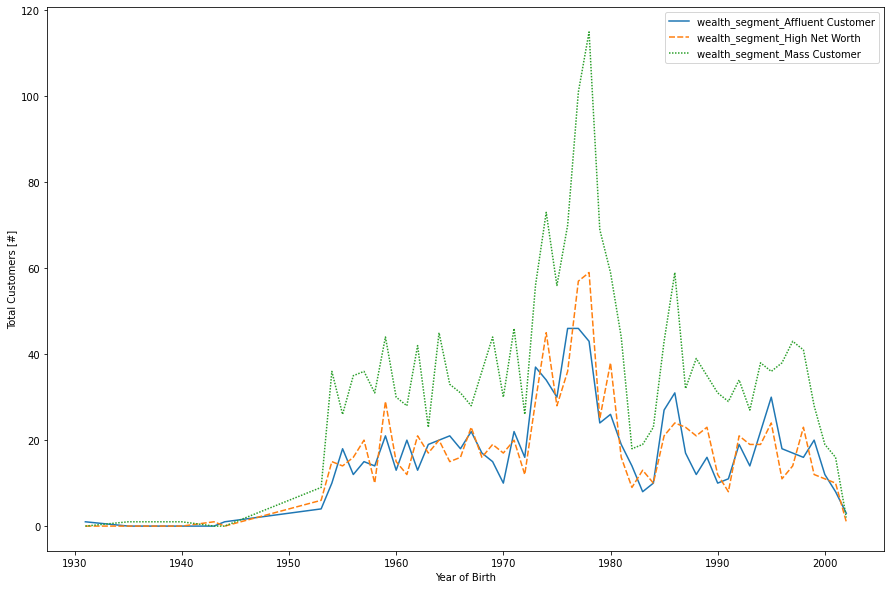

In [367]:
plt.subplots(figsize=[15, 10])
customer_by_year_by_wealth_plot = sns.lineplot(data = customer_by_year_by_wealth)
plt.xlabel('Year of Birth', fontsize=10)
plt.ylabel('Total Customers [#]', fontsize=10);

In [368]:
customer_by_year_by_wealth_plot.figure.savefig('Customers by Wealth by Birth Year.png')

In [162]:
customer_demographic_value_counts=[pd.DataFrame(customer_demographic[customer_demographic.columns[i]].value_counts()).T for i in range(len(customer_demographic.columns))]
customer_demographic_value_counts

[             2047  2732  2728  677   2724  673   2720  669   2716  665   ...  \
 customer_id     1     1     1     1     1     1     1     1     1     1  ...   
 
              1330  3375  1326  3371  1322  3367  1318  3363  1314  2049  
 customer_id     1     1     1     1     1     1     1     1     1     1  
 
 [1 rows x 3912 columns],
             Timmie  Max  Tobe  Osgood  Corabelle  Pail  Hubie  Kim  Gerome  \
 first_name       5    5     5       4          4     4      4    4       4   
 
             Lindsay  ...  Paddie  Codie  Ainsley  Kaleb  Kristin  Megan  \
 first_name        4  ...       1      1        1      1        1      1   
 
             Wylie  Barbe  Mab  Duffie  
 first_name      1      1    1       1  
 
 [1 rows x 3078 columns],
            N/A  Pristnor  Ramsdell  Wickey  Creebo  Hackworth  Grebner  Chape  \
 last_name  121         3         3       2       2          2        2      2   
 
            Brownstein  Gottelier  ...  Zima  Kegan  Hatchell  Diess

In [163]:
# Format 'Gender' column for customer demographics
customer_demographic[['gender']]=customer_demographic[['gender']].replace(['Femal','F'],'Female').replace(['M'],'Male')

In [164]:
customer_demographic_gender=customer_demographic['gender'].value_counts()
customer_demographic_gender

Female    2039
Male      1873
Name: gender, dtype: int64

Text(0, 0.5, 'Number of Customers')

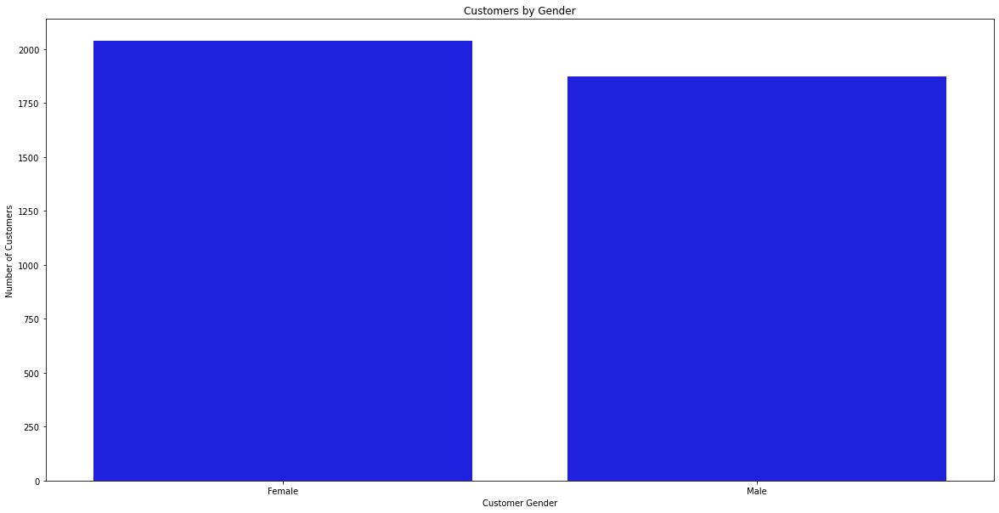

In [165]:
ax = plt.subplots(figsize=[20,10])
ax = sns.barplot(x=customer_demographic_gender.index,y=customer_demographic_gender,color='blue')
ax.set_title("Customers by Gender")
ax.set_xlabel("Customer Gender")
ax.set_ylabel("Number of Customers")

In [166]:
customer_demographic['past_3_years_bike_related_purchases']

0       93
1       81
2       61
3       33
4       56
        ..
3907    93
3908     8
3909    87
3910    11
3911    76
Name: past_3_years_bike_related_purchases, Length: 3912, dtype: int64

In [167]:
customer_related_purchases_count=customer_demographic['past_3_years_bike_related_purchases'].value_counts()
customer_related_purchases_count_sorted=customer_related_purchases_count.sort_index()
customer_related_purchases_count_sorted

0     37
1     33
2     50
3     29
4     36
      ..
95    26
96    46
97    42
98    47
99    44
Name: past_3_years_bike_related_purchases, Length: 100, dtype: int64

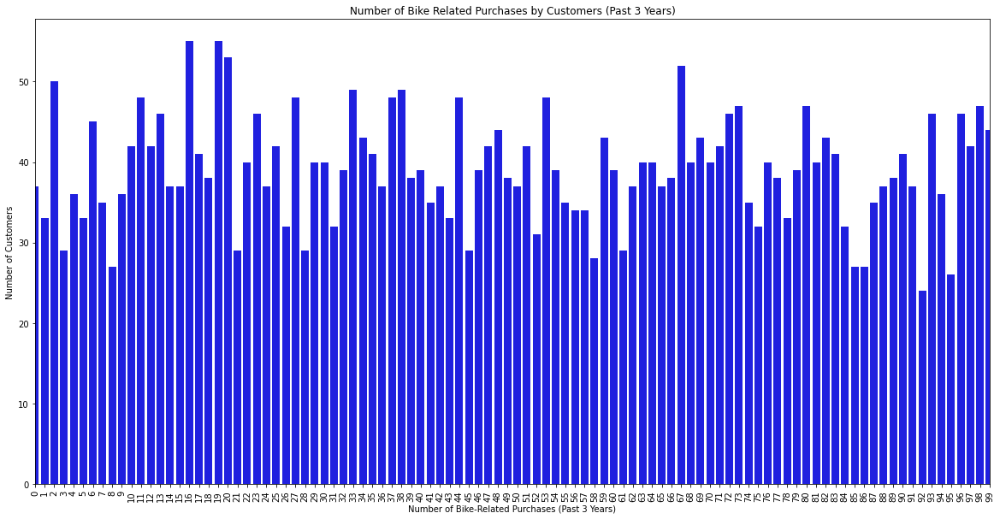

In [168]:
ax = plt.subplots(figsize=[20,10])
ax = sns.barplot(x=customer_related_purchases_count_sorted.index,y=customer_related_purchases_count_sorted.values,color='blue')
ax.set_xlim(0,99)
ax.set_title("Number of Bike Related Purchases by Customers (Past 3 Years)")
ax.set_xlabel("Number of Bike-Related Purchases (Past 3 Years)")
ax.set_ylabel("Number of Customers")
ax.set_xticklabels(customer_related_purchases_count_sorted.index,rotation=90);

In [169]:
past_3_year_purchases = ax 

past_3_year_purchases.figure.savefig('Bike Related Purchases Past 3 Years.png')

In [170]:
customer_address=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='CustomerAddress',skiprows=1)
customer_address.to_csv('customer_address.csv') # Remove extra column created
customer_address.head()

,customer_id,address,postcode,state,country,property_valuation
0,1,060 Morning Avenue,2016,New South Wales,Australia,10
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10
2,4,0 Holy Cross Court,4211,QLD,Australia,9
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4
4,6,9 Oakridge Court,3216,VIC,Australia,9


In [171]:
customer_address[customer_address.duplicated(['address'])]

,customer_id,address,postcode,state,country,property_valuation
2470,2475,3 Talisman Place,4017,QLD,Australia,5
2980,2985,3 Mariners Cove Terrace,2216,NSW,Australia,10
3535,3540,64 Macpherson Junction,4061,QLD,Australia,8


In [172]:
customer_address.shape
# Mismatch between customer demographic (4000) and customer address (3999) means that we will delete the last row in customer demographic to smooth the merge

(3999, 6)

In [173]:
customer_address.count()

customer_id           3999
address               3999
postcode              3999
state                 3999
country               3999
property_valuation    3999
dtype: int64

In [174]:
len(customer_address.all())

6

In [175]:
# Not missing any rows (except for the last one)

In [176]:
customer_address.describe()

,customer_id,postcode,property_valuation
count,3999.000000,3999.000000,3999.000000
mean,2003.987997,2985.755939,7.514379
std,1154.576912,844.878364,2.824663
min,1.000000,2000.000000,1.000000
25%,1004.500000,2200.000000,6.000000
50%,2004.000000,2768.000000,8.000000
75%,3003.500000,3750.000000,10.000000
max,4003.000000,4883.000000,12.000000


In [376]:
property_values = pd.DataFrame(customer_address['property_valuation'].value_counts().sort_index())
property_values

,property_valuation
1,154
2,143
3,186
4,214
5,225
6,238
7,493
8,646
9,647
10,577


In [384]:
#propery_values_plot=customer_address['property_valuation'].value_counts().sort_index().plot.bar(figsize=(20,10)).set_title('Property Values')
#propery_values_plot;

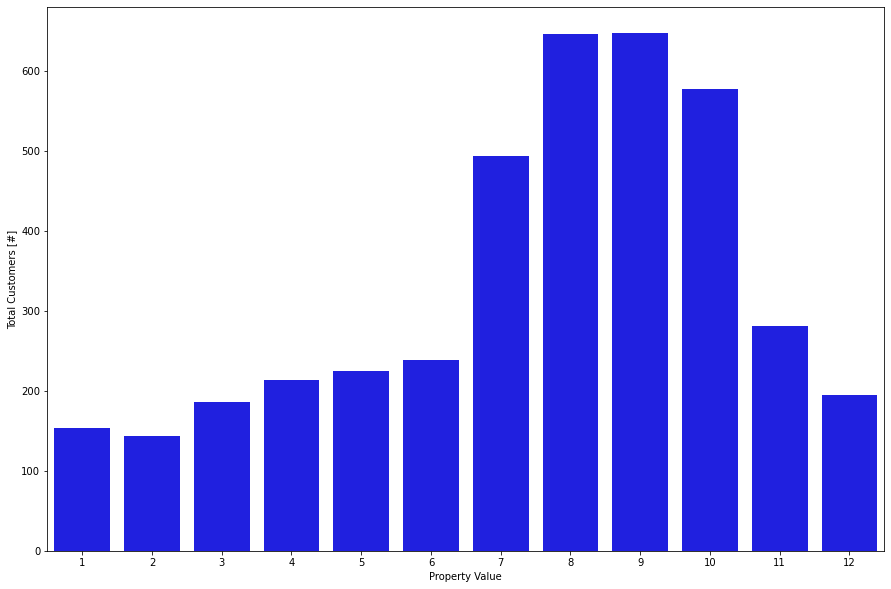

In [388]:
plt.subplots(figsize=[15,10])
propery_values_plot = sns.barplot(data = property_values, x = property_values.index, y = 'property_valuation', color = 'blue')
plt.xlabel('Property Value', fontsize=10)
plt.ylabel('Total Customers [#]', fontsize=10);

In [389]:
propery_values_plot.figure.savefig('Property Values.png')

Geoencode addresses and plot on map

In [179]:
customer_address[['state']]=customer_address[['state']].replace('New South Wales','NSW').replace('Victoria','VIC')
customer_address['state'].value_counts()

NSW    2140
VIC    1021
QLD     838
Name: state, dtype: int64

In [180]:

#geolocator = Nominatim(user_agent='KPMG Virtual Internship')

# Nominatim check, which shows it doesn't work on addresses in Australia
# location=geolocator.geocode('2153',country_codes='au')
# print((location))

Using Arcgis geocoder geocode Australia addresses, since Nominatim

In [181]:
# Doesn't work since address could not be found, zip could though, try google api (optional)
geopy_input=customer_address[['address','postcode','state']].astype('str').apply(', '.join,axis=1)
# geopy_input=customer_address['address']
geopy_input

0              060 Morning Avenue, 2016, NSW
1             6 Meadow Vale Court, 2153, NSW
2              0 Holy Cross Court, 4211, QLD
3             17979 Del Mar Point, 2448, NSW
4                9 Oakridge Court, 3216, VIC
                        ...                 
3994              1482 Hauk Trail, 3064, VIC
3995    57042 Village Green Point, 4511, QLD
3996       87 Crescent Oaks Alley, 2756, NSW
3997             8194 Lien Street, 4032, QLD
3998              320 Acker Drive, 2251, NSW
Length: 3999, dtype: object

In [182]:
geopy_input_test=geopy_input[92:100]
geopy_input_test

92            6088 Roxbury Hill, 2766, NSW
93            105 Shelley Alley, 2209, NSW
94               079 Merry Park, 2160, NSW
95            8722 Summit Alley, 2065, NSW
96            9554 Artisan Pass, 2150, NSW
97       55850 Butterfield Road, 2168, NSW
98     68 Little Fleur Crossing, 2046, NSW
99    85688 New Castle Crossing, 4171, QLD
dtype: object

In [183]:
#coordinates_test=batch_geocode(addresses=geopy_input_test,source_country='AUS',category='Point Address')

In [184]:
geolocator=ArcGIS(timeout=100000)

In [185]:
from geopy.extra.rate_limiter import RateLimiter
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1,error_wait_seconds=60)

In [186]:
df_coordinates=pd.read_csv('df_coordinates.csv')
df_coordinates

,latitude,longitude
0,-35.025056,149.268539
1,-34.191971,150.785379
2,-28.030577,153.392608
3,-30.611960,152.966901
4,-37.249461,144.467127
...,...,...
3994,-37.566988,144.938360
3995,-27.075405,153.085196
3996,-33.579927,150.860744
3997,-27.385400,153.023803


Map ccordinates

In [187]:
# Calculate centerpoint of all coordinates
ave_lat = df_coordinates['latitude'].values.sum() / len(df_coordinates)
ave_lon = df_coordinates['longitude'].values.sum() / len(df_coordinates)

In [188]:
# Load map centred on average coordinates
my_map = folium.Map(location=[ave_lat, ave_lon], zoom_start=5)
my_map

In [189]:
#add markers - change points to sr_coordinates && change Marker to Circle
my_map = folium.Map(location=[ave_lat, ave_lon], zoom_start=5)
for i in range(len(df_coordinates)):  
    folium.CircleMarker(df_coordinates.loc[i],radius=3,fill_color='red').add_to(my_map)
my_map

Merge dataframes to expand map

Include wealth segment in graph and code it by color

In [190]:
customer_transactions_profits

,transactions_count,customer_profit_margin_average,transactions_total_list_price,transactions_total_profit,profit_per_transactions
customer_id,,,,,
1,11,0.322590,9084.45,3018.090000,274.371818
2,3,0.554722,4149.07,2226.260000,742.086667
3,8,0.306902,9888.23,3362.810000,420.351250
4,2,0.223743,1047.72,220.570000,110.285000
5,6,0.342018,5903.20,2394.940000,399.156667
...,...,...,...,...,...
3497,3,0.389262,3744.07,1648.320000,549.440000
3498,6,0.469457,5177.06,3147.330000,524.555000
3499,7,0.562465,7673.48,4955.250000,707.892857


In [191]:
df_customer_coordinates_profits=pd.merge(left=df_coordinates,right=customer_transactions_profits,left_index=True,right_on='customer_id').reset_index()
df_customer_coordinates_profits.head()

,customer_id,latitude,longitude,transactions_count,customer_profit_margin_average,transactions_total_list_price,transactions_total_profit,profit_per_transactions
0,1,-34.191971,150.785379,11,0.322590,9084.45,3018.09,274.371818
1,2,-28.030577,153.392608,3,0.554722,4149.07,2226.26,742.086667
2,3,-30.611960,152.966901,8,0.306902,9888.23,3362.81,420.351250
3,4,-37.249461,144.467127,2,0.223743,1047.72,220.57,110.285000
4,5,-33.424920,149.539126,6,0.342018,5903.20,2394.94,399.156667


In [192]:
# Add 'wealth_segment'
customer_demographic[['customer_id','wealth_segment']]

,customer_id,wealth_segment
0,1,Mass Customer
1,2,Mass Customer
2,3,Mass Customer
3,4,Mass Customer
4,5,Affluent Customer
...,...,...
3907,3995,Mass Customer
3908,3996,Mass Customer
3909,3997,High Net Worth
3910,3999,Affluent Customer


In [193]:
df_customer_coordinates_profits_segment=pd.merge(left=df_customer_coordinates_profits,right=customer_demographic[['customer_id','wealth_segment']],left_on='customer_id',right_on='customer_id')
df_customer_coordinates_profits_segment

,customer_id,latitude,longitude,transactions_count,customer_profit_margin_average,transactions_total_list_price,transactions_total_profit,profit_per_transactions,wealth_segment
0,1,-34.191971,150.785379,11,0.322590,9084.45,3018.09,274.371818,Mass Customer
1,2,-28.030577,153.392608,3,0.554722,4149.07,2226.26,742.086667,Mass Customer
2,3,-30.611960,152.966901,8,0.306902,9888.23,3362.81,420.351250,Mass Customer
3,4,-37.249461,144.467127,2,0.223743,1047.72,220.57,110.285000,Mass Customer
4,5,-33.424920,149.539126,6,0.342018,5903.20,2394.94,399.156667,Affluent Customer
...,...,...,...,...,...,...,...,...,...
3411,3496,-34.191288,150.788371,4,0.347186,4725.38,2045.84,511.460000,Mass Customer
3412,3497,-34.054601,150.738967,3,0.389262,3744.07,1648.32,549.440000,Affluent Customer
3413,3498,-33.780420,151.101914,6,0.469457,5177.06,3147.33,524.555000,Mass Customer
3414,3499,-37.998995,145.120657,7,0.562465,7673.48,4955.25,707.892857,Mass Customer


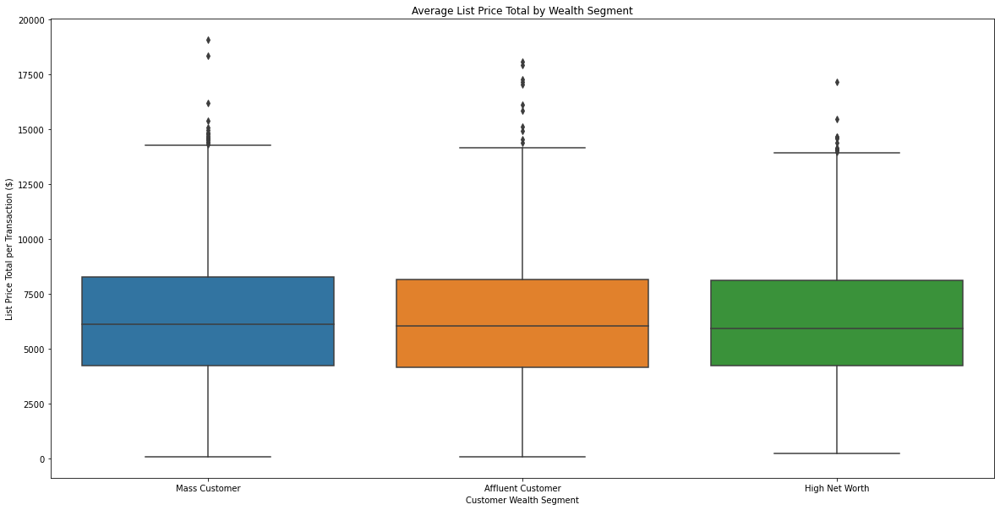

In [194]:
# Plot by wealth segment for number of purhcases, transaction profit and count
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='wealth_segment',y='transactions_total_list_price',data=df_customer_coordinates_profits_segment)
ax.set_title("Average List Price Total by Wealth Segment")
ax.set_xlabel("Customer Wealth Segment")
ax.set_ylabel("List Price Total per Transaction ($)");

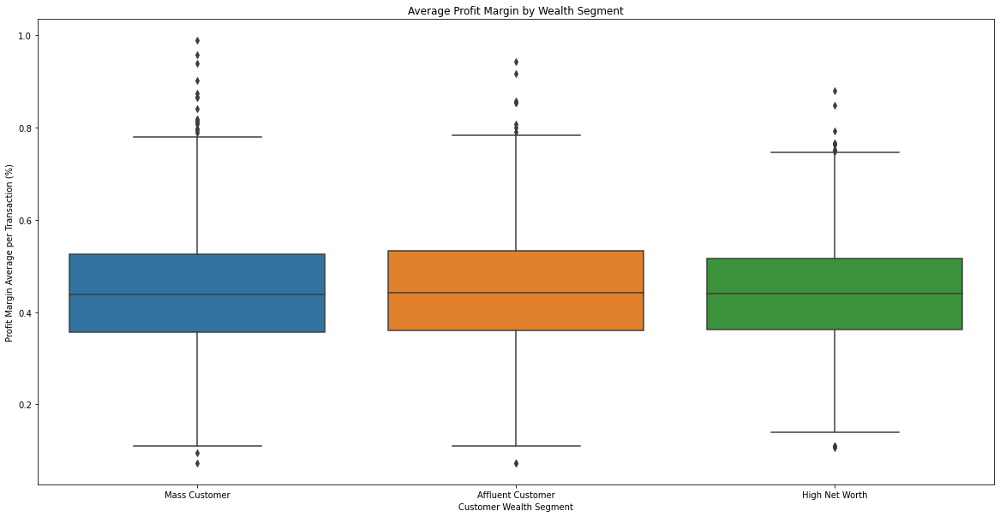

In [195]:
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='wealth_segment',y='customer_profit_margin_average',data=df_customer_coordinates_profits_segment)
ax.set_title("Average Profit Margin by Wealth Segment")
ax.set_xlabel("Customer Wealth Segment")
ax.set_ylabel("Profit Margin Average per Transaction (%)");

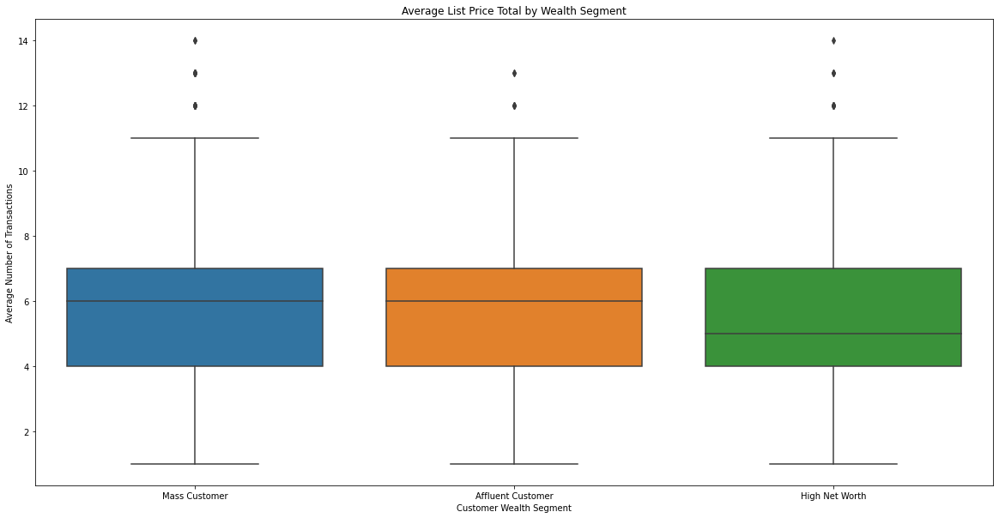

In [196]:
ax = plt.subplots(figsize=[20,10])
ax = sns.boxplot(x='wealth_segment',y='transactions_count',data=df_customer_coordinates_profits_segment)
ax.set_title("Average List Price Total by Wealth Segment")
ax.set_xlabel("Customer Wealth Segment")
ax.set_ylabel("Average Number of Transactions");

In [197]:
df_customer_coordinates_profits_segment.describe()

,customer_id,latitude,longitude,transactions_count,customer_profit_margin_average,transactions_total_list_price,transactions_total_profit,profit_per_transactions
count,3416.000000,3416.000000,3416.000000,3416.000000,3416.000000,3416.000000,3416.000000,3416.000000
mean,1749.121194,-32.668629,148.489805,5.720726,0.445218,6329.538065,3120.489830,549.138714
std,1010.392265,6.357188,15.722774,2.323826,0.126239,2956.672767,1770.197523,236.848468
min,1.000000,-42.738300,-121.802340,1.000000,0.072214,60.340000,15.080000,15.080000
25%,874.750000,-36.063440,145.592646,4.000000,0.359606,4192.090000,1834.892500,384.812500
50%,1748.500000,-33.805715,150.883207,6.000000,0.438680,6018.320000,2848.865000,530.491667
75%,2622.250000,-30.571402,151.525690,7.000000,0.524993,8188.847500,4170.790000,695.196500
max,3500.000000,48.056760,172.640140,14.000000,0.989604,19071.320000,11668.950000,1702.550000


In [198]:
# Map
colors = {'Mass Customer' : 'green', 'Affluent Customer' : 'blue' , 'High Net Worth' : 'orange'}

my_map=folium.Map(location=[ave_lat, ave_lon], zoom_start=6)
for i in range(len(df_customer_coordinates_profits)):  
    folium.Circle(df_customer_coordinates_profits[['latitude','longitude']].loc[i].tolist(),
                        radius=(df_customer_coordinates_profits[['transactions_total_profit']].loc[i]*5).tolist(),
                        fill_opacity=.5,
                        markeredgewidth=0.0,
                        fill_color=colors[customer_demographic['wealth_segment'].loc[i]]).add_to(my_map)
my_map

Macro-level scale (above)

In [199]:
# Map
colors = {'Mass Customer' : 'red', 'Affluent Customer' : 'yellow' , 'High Net Worth' : 'blue'}

my_map=folium.Map(location=[ave_lat, ave_lon], zoom_start=5)
for i in range(len(df_customer_coordinates_profits)):  
    folium.Circle(df_customer_coordinates_profits[['latitude','longitude']].loc[i].tolist(),
                        radius=(df_customer_coordinates_profits[['transactions_total_profit']].loc[i]*.5).tolist(),
                        fill_opacity=.5,
                        markeredgewidth=0.0,
                        fill_color=colors[customer_demographic['wealth_segment'].loc[i]]).add_to(my_map)
my_map

Micro-level scale (above)

In [200]:
# Save map
my_map.save("./customer map.html")

In [201]:
# Add age to location and map by age

In [202]:
# Debug i
# i

In [203]:
customer_address_value_counts=[pd.DataFrame(customer_address[customer_address.columns[i]].value_counts()).T for i in range(len(customer_address.columns))]
customer_address_value_counts

[             2047  653   2728  677   2724  673   2720  669   2716  665   ...  \
 customer_id     1     1     1     1     1     1     1     1     1     1  ...   
 
              1334  3379  1330  3375  1326  3371  1322  3367  1318  2049  
 customer_id     1     1     1     1     1     1     1     1     1     1  
 
 [1 rows x 3999 columns],
          64 Macpherson Junction  3 Mariners Cove Terrace  3 Talisman Place  \
 address                       2                        2                 2   
 
          134 Knutson Street  18264 Maryland Way  9 Schmedeman Hill  \
 address                   1                   1                  1   
 
          3 Lyons Road  45 Hazelcrest Junction  28008 Mesta Lane  \
 address             1                       1                 1   
 
          6330 Monica Way  ...  52408 Autumn Leaf Road  5 Loftsgordon Avenue  \
 address                1  ...                       1                     1   
 
          72419 Eagan Road  010 Namekagon Parkway  0 M

In [204]:
customer_profit_total

,3_year_product_profit
customer_id,
1,3018.090000
2,2226.260000
3,3362.810000
4,220.570000
5,2394.940000
...,...
3497,1648.320000
3498,3147.330000
3499,4955.250000


In [205]:
customer_demographic.count()

customer_id                            3912
first_name                             3912
last_name                              3912
gender                                 3912
past_3_years_bike_related_purchases    3912
DOB                                    3912
job_title                              3912
job_industry_category                  3912
wealth_segment                         3912
deceased_indicator                     3912
owns_car                               3912
tenure                                 3912
dtype: int64

In [206]:
# Joining data for customers that have transaction history (4000 --> 3494)
customer_demographic_address=pd.merge(left=customer_demographic,right=customer_address,left_on='customer_id',right_on='customer_id')
now = pd.to_datetime('now')
customer_demographic_address['age']=(now - customer_demographic_address['DOB']).astype('<m8[Y]')
customer_demographic_address

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,age
0,1,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,060 Morning Avenue,2016,NSW,Australia,10,66.0
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,Yes,16.0,6 Meadow Vale Court,2153,NSW,Australia,10,39.0
2,4,Talbot,N/A,Male,33,1961-10-03,N/A,IT,Mass Customer,N,No,7.0,0 Holy Cross Court,4211,QLD,Australia,9,58.0
3,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,N/A,Affluent Customer,N,Yes,8.0,17979 Del Mar Point,2448,NSW,Australia,4,43.0
4,6,Curr,Duckhouse,Male,35,1966-09-16,N/A,Retail,High Net Worth,N,Yes,13.0,9 Oakridge Court,3216,VIC,Australia,9,54.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3903,3995,Rusty,Iapico,Male,93,1975-12-12,Staff Scientist,Manufacturing,Mass Customer,N,Yes,14.0,613 Erie Lane,2088,NSW,Australia,12,44.0
3904,3996,Rosalia,Halgarth,Female,8,1975-08-09,VP Product Management,Health,Mass Customer,N,No,19.0,0 Transport Center,3977,VIC,Australia,6,45.0
3905,3997,Blanch,Nisuis,Female,87,2001-07-13,Statistician II,Manufacturing,High Net Worth,N,Yes,1.0,4 Dovetail Crossing,2350,NSW,Australia,2,19.0
3906,3999,Patrizius,N/A,Male,11,1973-10-24,N/A,Manufacturing,Affluent Customer,N,Yes,10.0,1482 Hauk Trail,3064,VIC,Australia,3,46.0


In [207]:
customer_demographic_address.count()

customer_id                            3908
first_name                             3908
last_name                              3908
gender                                 3908
past_3_years_bike_related_purchases    3908
DOB                                    3908
job_title                              3908
job_industry_category                  3908
wealth_segment                         3908
deceased_indicator                     3908
owns_car                               3908
tenure                                 3908
address                                3908
postcode                               3908
state                                  3908
country                                3908
property_valuation                     3908
age                                    3908
dtype: int64

In [208]:
## Put into algorithm

customer_demographic_address_profits=pd.merge(left=customer_demographic_address,right=customer_profit_total,left_on='customer_id',right_on='customer_id')
customer_demographic_address_profits=pd.merge(left=customer_demographic_address_profits,right=customer_transaction_count,left_on='customer_id',right_on='customer_id')
# Keep '3 year product profit' as our last variable for our target variable
three_year_product_profit=customer_demographic_address_profits.pop('3_year_product_profit')
customer_demographic_address_profits=pd.concat([customer_demographic_address_profits,three_year_product_profit],axis=1)
customer_demographic_address_profits

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,age,bike_purchases,3_year_product_profit
0,1,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,060 Morning Avenue,2016,NSW,Australia,10,66.0,11,3018.09
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,Yes,16.0,6 Meadow Vale Court,2153,NSW,Australia,10,39.0,3,2226.26
2,4,Talbot,N/A,Male,33,1961-10-03,N/A,IT,Mass Customer,N,No,7.0,0 Holy Cross Court,4211,QLD,Australia,9,58.0,2,220.57
3,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,N/A,Affluent Customer,N,Yes,8.0,17979 Del Mar Point,2448,NSW,Australia,4,43.0,6,2394.94
4,6,Curr,Duckhouse,Male,35,1966-09-16,N/A,Retail,High Net Worth,N,Yes,13.0,9 Oakridge Court,3216,VIC,Australia,9,54.0,5,3946.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3407,3496,Danya,Burnyeat,Male,99,1986-04-25,Editor,Manufacturing,Mass Customer,N,Yes,19.0,2565 Caliangt Point,2171,NSW,Australia,9,34.0,4,2045.84
3408,3497,Thia,O'Day,Female,73,1986-05-03,Administrative Assistant IV,Manufacturing,Affluent Customer,N,Yes,18.0,96 Delladonna Trail,3976,VIC,Australia,5,34.0,3,1648.32
3409,3498,Lois,Abrahim,Female,28,1995-11-02,N/A,Manufacturing,Mass Customer,N,No,5.0,3 Nova Point,3012,VIC,Australia,4,24.0,6,3147.33
3410,3499,Shelton,Tewkesberrie,Male,29,1979-06-17,N/A,Manufacturing,Mass Customer,N,Yes,7.0,310 Stephen Terrace,4073,QLD,Australia,9,41.0,7,4955.25


In [209]:
customer_demographic_address_profits[customer_demographic_address_profits['deceased_indicator'] == 'Y']

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,age,bike_purchases,3_year_product_profit
732,753,Josy,St. Quentin,Female,82,1970-03-07,Food Chemist,Health,Affluent Customer,Y,Yes,6.0,37 Dorton Street,2594,NSW,Australia,3,50.0,8,7727.17


In [210]:
customer_demographic_address_profits.count()

customer_id                            3412
first_name                             3412
last_name                              3412
gender                                 3412
past_3_years_bike_related_purchases    3412
DOB                                    3412
job_title                              3412
job_industry_category                  3412
wealth_segment                         3412
deceased_indicator                     3412
owns_car                               3412
tenure                                 3412
address                                3412
postcode                               3412
state                                  3412
country                                3412
property_valuation                     3412
age                                    3412
bike_purchases                         3412
3_year_product_profit                  3412
dtype: int64

In [211]:
# Drop deceased customer and 'deceased_indicator' column
customer_demographic_address_profits_clean = customer_demographic_address_profits.drop(732).drop(columns=['job_title','DOB','first_name','last_name','customer_id','deceased_indicator','address','postcode','country','3_year_product_profit']).reset_index(drop=True)
customer_demographic_address_profits_clean.to_csv('customer_demographic_address_profits.csv')
customer_demographic_address_profits_clean

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age,bike_purchases
0,Female,93,Health,Mass Customer,Yes,11.0,NSW,10,66.0,11
1,Male,81,Financial Services,Mass Customer,Yes,16.0,NSW,10,39.0,3
2,Male,33,IT,Mass Customer,No,7.0,QLD,9,58.0,2
3,Female,56,N/A,Affluent Customer,Yes,8.0,NSW,4,43.0,6
4,Male,35,Retail,High Net Worth,Yes,13.0,VIC,9,54.0,5
...,...,...,...,...,...,...,...,...,...,...
3406,Male,99,Manufacturing,Mass Customer,Yes,19.0,NSW,9,34.0,4
3407,Female,73,Manufacturing,Affluent Customer,Yes,18.0,VIC,5,34.0,3
3408,Female,28,Manufacturing,Mass Customer,No,5.0,VIC,4,24.0,6
3409,Male,29,Manufacturing,Mass Customer,Yes,7.0,QLD,9,41.0,7


In [212]:
# Verifies deceased person being dropped
# customer_demographic_address_profits_clean=customer_demographic_address_profits.drop(732)
# customer_demographic_address_profits_clean[customer_demographic_address_profits_clean['deceased_indicator'] == 'Y']

In [213]:
customer_demographic_address_profits_clean.count()

gender                                 3411
past_3_years_bike_related_purchases    3411
job_industry_category                  3411
wealth_segment                         3411
owns_car                               3411
tenure                                 3411
state                                  3411
property_valuation                     3411
age                                    3411
bike_purchases                         3411
dtype: int64

In [214]:
customer_demographic_address_profits_clean.fillna('N/A',inplace=True)
customer_demographic_address_profits_clean.count()

gender                                 3411
past_3_years_bike_related_purchases    3411
job_industry_category                  3411
wealth_segment                         3411
owns_car                               3411
tenure                                 3411
state                                  3411
property_valuation                     3411
age                                    3411
bike_purchases                         3411
dtype: int64

Split data and encode for linear regression model

In [215]:
customer_model_data = customer_demographic_address_profits_clean

In [216]:
customer_model_data_categorical = customer_model_data.select_dtypes(exclude=np.number)
customer_model_data_categorical_encoded = customer_model_data_categorical.apply(LabelEncoder().fit_transform)

In [217]:
customer_model_data_numerical = customer_model_data._get_numeric_data()

In [218]:
# Merge encoded datasets by original order (concat & reindex)
customer_model_data_encoded=pd.concat([customer_model_data_categorical_encoded,customer_model_data_numerical],axis=1)
customer_model_data_encoded=customer_model_data_encoded.reindex(columns=customer_model_data.columns)
customer_model_data_encoded.head()

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age,bike_purchases
0,0,93,3,2,1,11.0,0,10,66.0,11
1,1,81,2,2,1,16.0,0,10,39.0,3
2,1,33,4,2,0,7.0,1,9,58.0,2
3,0,56,6,0,1,8.0,0,4,43.0,6
4,1,35,8,1,1,13.0,2,9,54.0,5


In [219]:
# Find and fix data that is skewed

In [220]:
# Create Test / Train split
# X
X = customer_model_data_encoded.drop(columns=customer_model_data_encoded.columns[~0])
# y
y = pd.DataFrame(customer_model_data_encoded.iloc[:,-1])

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

In [221]:
# Build decision tree regressor
regressor = DecisionTreeRegressor(max_depth=3)

regressor.fit(X_train, y_train)

yhat = regressor.predict(X_test)

regressor.score(X,y)

0.0022861100472537643

In [222]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, yhat)))

Mean Absolute Error: 1.8788714938518536
Mean Squared Error: 5.523731034950589
Root Mean Squared Error: 2.350261907735091


In [223]:
profits_mean = customer_demographic_address_profits_clean['bike_purchases'].mean()
profits_mean

5.663734975080621

In [224]:
((metrics.mean_absolute_error(y_test, yhat)) / profits_mean) * 100

33.17371844054388

#### pd.DataFrame(regressor.feature_importances_,index=X.columns,columns=['Feature Importance']).sort_values(by=['Feature Importance'],ascending=False)

In [225]:
# Build linear regression model

regressor_linear = LinearRegression().fit(X_train, y_train)

yhat = regressor_linear.predict(X_test)

regressor_linear.score(X,y)

-1.8140328490234836e-05

In [226]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, yhat)))

Mean Absolute Error: 1.8776546235842495
Mean Squared Error: 5.489499944476573
Root Mean Squared Error: 2.3429681910936333


In [227]:
((metrics.mean_absolute_error(y_test, yhat)) / profits_mean) * 100

33.152233143774914

In [228]:
# Normalize dataset - double-check

# Perform on continuous numerical features?

customer_model_data_encoded_normalized = pd.DataFrame(preprocessing.normalize(customer_model_data_encoded),columns=customer_model_data_encoded.columns)
customer_model_data_encoded_normalized.head()

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age,bike_purchases
0,0.000000,0.804569,0.025954,0.017303,0.008651,0.095164,0.000000,0.086513,0.570985,0.095164
1,0.010874,0.880799,0.021748,0.021748,0.010874,0.173985,0.000000,0.108741,0.424088,0.032622
2,0.014730,0.486083,0.058919,0.029460,0.000000,0.103109,0.014730,0.132568,0.854328,0.029460
3,0.000000,0.781252,0.083706,0.000000,0.013951,0.111607,0.000000,0.055804,0.599890,0.083706
4,0.014929,0.522504,0.119430,0.014929,0.014929,0.194073,0.029857,0.134358,0.806150,0.074643


In [229]:
# Create Test / Train split
# X
X_n = customer_model_data_encoded_normalized.drop(columns=customer_model_data_encoded_normalized.columns[~0])
# y
y_n = pd.DataFrame(customer_model_data_encoded_normalized.iloc[:,-1])

X_train, X_test, y_train, y_test = train_test_split(X_n, y_n, train_size=0.8, random_state=0)

In [230]:
# Build Linear regression model
regressor_linear_normalized = LinearRegression().fit(X_train, y_train)

yhat = regressor_linear_normalized.predict(X_test)

regressor_linear_normalized.score(X,y)

-9.846031921156943

In [231]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, yhat)))

Mean Absolute Error: 0.03123191741455412
Mean Squared Error: 0.0017259176067407123
Root Mean Squared Error: 0.041544164532948694


In [232]:
((metrics.mean_absolute_error(y_test, yhat)) / profits_mean) * 100

0.5514367736479326

In [233]:
# Build decision tree regressor with normalized data

In [234]:
# Data to be inserted into our predictive models
# customer_demographic_address_profits_clean = customer_model_data_encoded

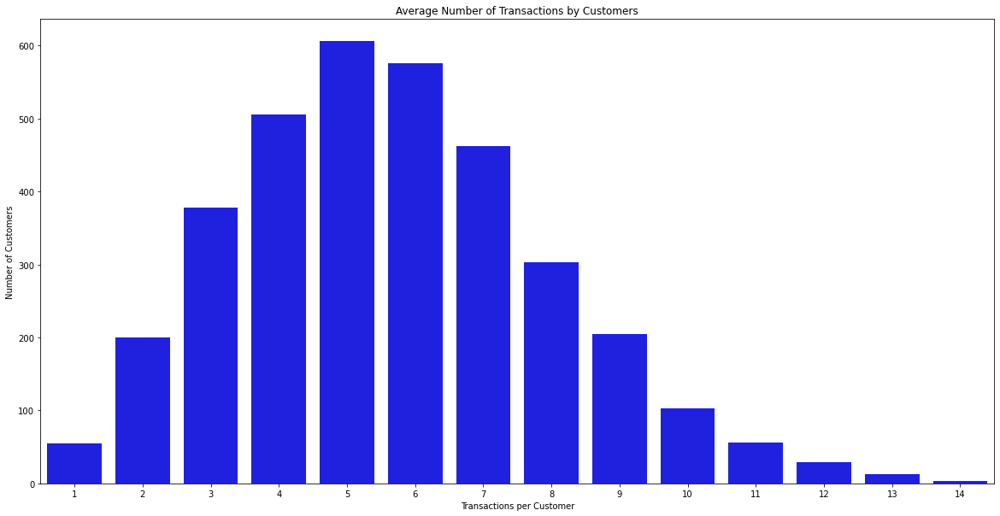

In [235]:
# Frequency of number of overall transactions by customer id
customer_purchases_frequency=pd.DataFrame(transactions.groupby(['customer_id'])['transaction_date'].count().value_counts().sort_index())

ax = plt.subplots(figsize=[20,10])
ax = sns.barplot(x=customer_purchases_frequency.index, y=customer_purchases_frequency['transaction_date'],color='blue')
ax.set_title("Average Number of Transactions by Customers")
ax.set_xlabel("Transactions per Customer")
ax.set_ylabel("Number of Customers");

In [236]:
customer_purchases_frequency.sum()

transaction_date    3494
dtype: int64

In [237]:
# Transactions with customer information to graph a time series by 'wealth segment'
transactions_customers=pd.merge(left=transactions,right=customer_demographic_address_profits,left_on='customer_id',right_on='customer_id')
transactions_dummies=pd.get_dummies(transactions_customers[['wealth_segment']])
transactions_by_wealth_dummies=pd.concat([transactions_customers['transaction_date'],transactions_dummies],axis=1)

In [238]:
transactions_customers[transactions_customers['bike_purchases']==2].describe()

,transaction_id,product_id,customer_id,online_order,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,age,bike_purchases,3_year_product_profit
count,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.0,388.000000
mean,9588.466495,45.257732,1681.309278,0.523196,1065.634691,542.139665,37734.755155,523.495026,0.433622,47.350515,10.953608,3000.087629,7.747423,42.304124,2.0,1046.990052
std,5884.354447,31.941008,996.078387,0.500107,591.894471,387.739405,2822.756799,490.395446,0.258998,28.607128,5.689004,887.093455,2.720981,11.877727,0.0,738.365563
min,34.000000,0.000000,4.000000,0.000000,12.010000,7.210000,33259.000000,4.800000,0.072214,0.000000,1.000000,2010.000000,1.000000,18.000000,2.0,35.740000
25%,4250.750000,15.000000,910.000000,0.000000,569.560000,215.140000,35323.500000,128.872500,0.249965,20.000000,6.000000,2191.000000,6.000000,34.000000,2.0,443.530000
50%,9576.500000,45.000000,1623.000000,1.000000,1101.100000,507.580000,37873.000000,356.500000,0.399998,45.500000,11.000000,2767.500000,8.000000,42.000000,2.0,926.730000
75%,14935.500000,71.000000,2486.000000,1.000000,1577.530000,778.690000,40410.000000,817.360000,0.644577,71.000000,16.000000,3810.000000,10.000000,51.000000,2.0,1490.770000
max,19973.000000,100.000000,3488.000000,1.000000,2091.470000,1759.850000,42710.000000,1702.550000,0.989604,99.000000,22.000000,4873.000000,12.000000,67.000000,2.0,3405.100000


In [239]:
transactions_customers[transactions_customers['bike_purchases']==3].describe()

,transaction_id,product_id,customer_id,online_order,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,age,bike_purchases,3_year_product_profit
count,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.000000,1113.0,1113.000000
mean,10023.973944,46.150045,1790.946092,0.505840,1127.350755,566.559497,38255.489668,560.791258,0.445074,46.215633,10.843666,3012.633423,7.342318,42.625337,3.0,1682.373774
std,5850.864731,31.026502,995.297583,0.500191,570.933279,403.910973,2867.570087,495.662662,0.264361,28.019653,5.552302,862.530622,2.878626,12.617746,0.0,859.648647
min,1.000000,0.000000,2.000000,0.000000,12.010000,7.210000,33259.000000,4.800000,0.072214,0.000000,1.000000,2000.000000,1.000000,19.000000,3.0,106.500000
25%,5087.000000,19.000000,961.000000,0.000000,590.260000,230.090000,35667.000000,139.230000,0.249973,23.000000,6.000000,2213.000000,5.000000,33.000000,3.0,978.420000
50%,10022.000000,46.000000,1829.000000,1.000000,1179.000000,513.850000,38216.000000,448.680000,0.399998,44.000000,11.000000,2763.000000,8.000000,43.000000,3.0,1644.610000
75%,15340.000000,74.000000,2692.000000,1.000000,1635.300000,820.780000,40779.000000,827.160000,0.673545,67.000000,16.000000,3910.000000,9.000000,52.000000,3.0,2222.290000
max,19999.000000,100.000000,3497.000000,1.000000,2091.470000,1759.850000,42710.000000,1702.550000,0.989604,99.000000,22.000000,4878.000000,12.000000,79.000000,3.0,4540.470000


In [240]:
transactions_customers[transactions_customers['bike_purchases']==7].describe()

,transaction_id,product_id,customer_id,online_order,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,age,bike_purchases,3_year_product_profit
count,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.000000,3178.0,3178.000000
mean,10145.569541,45.389553,1749.975771,0.490245,1112.848439,555.637565,38186.294210,557.210875,0.448894,49.447137,10.852423,2989.953744,7.414097,43.006608,7.0,3900.476123
std,5792.810092,30.239667,1001.423063,0.499984,586.482259,410.213177,2874.954222,497.697829,0.264814,28.034769,5.597275,875.883567,2.872983,12.430162,0.0,1442.354275
min,2.000000,0.000000,12.000000,0.000000,12.010000,7.210000,33259.000000,4.800000,0.072214,0.000000,1.000000,2008.000000,1.000000,18.000000,7.0,741.130000
25%,5170.750000,18.000000,923.000000,0.000000,586.450000,215.030000,35560.000000,139.230000,0.249986,25.000000,6.000000,2177.000000,5.000000,33.000000,7.0,2839.350000
50%,10162.000000,44.500000,1766.500000,0.000000,1163.890000,464.720000,38216.000000,445.210000,0.399998,50.000000,11.000000,2759.000000,8.000000,43.000000,7.0,3791.665000
75%,15167.750000,71.000000,2576.000000,1.000000,1635.300000,795.100000,40672.000000,830.240000,0.673545,73.000000,16.000000,3690.000000,9.000000,53.000000,7.0,4868.870000
max,20000.000000,100.000000,3499.000000,1.000000,2091.470000,1759.850000,42710.000000,1702.550000,0.989604,99.000000,22.000000,4877.000000,12.000000,77.000000,7.0,9633.410000


In [241]:
transactions_customers[transactions_customers['bike_purchases']==8].describe()

,transaction_id,product_id,customer_id,online_order,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,age,bike_purchases,3_year_product_profit
count,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.0,2320.000000
mean,10111.231897,46.015086,1720.572414,0.486207,1117.222539,578.337185,38150.990517,538.885353,0.435531,49.137931,10.720690,2982.420690,7.544828,42.996552,8.0,4311.082828
std,5724.391937,30.600167,1010.485063,0.499917,578.074117,413.648821,2885.647224,486.949600,0.259848,28.726393,5.481672,838.042827,2.849641,12.028857,0.0,1451.320590
min,19.000000,0.000000,48.000000,0.000000,12.010000,7.210000,33259.000000,4.800000,0.072214,0.000000,1.000000,2000.000000,1.000000,18.000000,8.0,1339.270000
25%,5193.250000,18.000000,835.000000,0.000000,586.450000,234.430000,35560.000000,135.850000,0.249965,22.000000,6.000000,2207.000000,6.000000,35.000000,8.0,3346.580000
50%,9994.500000,45.000000,1640.000000,0.000000,1163.890000,521.940000,38206.000000,437.460000,0.399998,48.000000,11.000000,2767.500000,8.000000,43.000000,8.0,4230.345000
75%,15037.250000,73.000000,2610.000000,1.000000,1635.300000,818.010000,40672.000000,812.440000,0.671122,74.000000,15.000000,3630.000000,10.000000,51.000000,8.0,5178.560000
max,19995.000000,100.000000,3482.000000,1.000000,2091.470000,1759.850000,42710.000000,1702.550000,0.989604,99.000000,22.000000,4825.000000,12.000000,67.000000,8.0,10787.600000


In [242]:
# Overall picture # transactions_customers.set_index('transaction_date').resample('M').sum()

In [243]:
# Analyze totals (sum)
transactions_customers.set_index('transaction_date')[['list_price','standard_cost','product_profit','profit_margin','past_3_years_bike_related_purchases','3_year_product_profit','bike_purchases']].resample('M').sum()

,list_price,standard_cost,product_profit,profit_margin,past_3_years_bike_related_purchases,3_year_product_profit,bike_purchases
transaction_date,,,,,,,
2017-01-31,1801750.65,898632.70,903117.95,726.779624,78813,5833963.88,10614
2017-02-28,1755611.15,901363.48,854247.67,693.242021,77774,5707657.56,10427
2017-03-31,1736753.94,883840.11,852913.83,701.153065,78154,5666792.30,10408
2017-04-30,1769650.22,892397.01,877253.21,702.879300,76633,5834014.70,10567
2017-05-31,1858262.12,959894.66,898367.46,709.687233,79611,6010279.68,10935
2017-06-30,1686425.42,852349.27,834076.15,680.233054,76393,5523043.09,10074
2017-07-31,1816802.84,906415.25,910387.59,734.915561,82989,5965655.05,10789
2017-08-31,1866059.51,926584.85,939474.66,764.988706,80693,6071402.75,11105
2017-09-30,1690439.47,847676.99,842762.48,682.449605,75502,5589335.14,10098


In [244]:
# Analyze averages (mean)
transactions_customers.set_index('transaction_date')[['online_order','list_price','standard_cost','product_profit','profit_margin','past_3_years_bike_related_purchases','tenure','property_valuation','age','3_year_product_profit','bike_purchases']].resample('M').mean()

,online_order,list_price,standard_cost,product_profit,profit_margin,past_3_years_bike_related_purchases,tenure,property_valuation,age,3_year_product_profit,bike_purchases
transaction_date,,,,,,,,,,,
2017-01-31,0.498765,1112.191759,554.711543,557.480216,0.448629,48.650000,10.747531,7.550617,42.961111,3601.212272,6.551852
2017-02-28,0.493687,1108.340372,569.042601,539.297771,0.437653,49.099747,10.719066,7.464646,42.275884,3603.319167,6.582702
2017-03-31,0.471366,1092.985488,556.224110,536.761378,0.441254,49.184393,10.522970,7.573317,42.748899,3566.263247,6.550031
2017-04-30,0.499687,1109.498571,559.496558,550.002013,0.440677,48.045768,10.700313,7.552351,42.277116,3657.689467,6.625078
2017-05-31,0.493895,1134.470159,586.016276,548.453883,0.433264,48.602564,10.703907,7.466422,43.163614,3669.279414,6.675824
2017-06-30,0.485227,1107.304938,559.651523,547.653414,0.446640,50.159554,10.588313,7.484570,42.278398,3626.423565,6.614576
2017-07-31,0.473939,1101.092630,549.342576,551.750055,0.445403,50.296364,10.751515,7.592727,42.756364,3615.548515,6.538788
2017-08-31,0.502959,1104.177225,548.275059,555.902166,0.452656,47.747337,10.786391,7.558580,42.626036,3592.546006,6.571006
2017-09-30,0.488816,1112.131230,557.682230,554.449000,0.448980,49.672368,10.640132,7.560526,42.640132,3677.194171,6.643421


In [245]:
number_customers_monthly=transactions_customers.set_index('transaction_date')[['transaction_id']].resample('M').count()
number_customers_monthly.columns=['number_customers']
number_customers_monthly

,number_customers
transaction_date,
2017-01-31,1620
2017-02-28,1584
2017-03-31,1589
2017-04-30,1595
2017-05-31,1638
2017-06-30,1523
2017-07-31,1650
2017-08-31,1690
2017-09-30,1520


In [246]:
transactions_customers.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,...,owns_car,tenure,address,postcode,state,country,property_valuation,age,bike_purchases,3_year_product_profit
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,...,Yes,10.0,984 Hoepker Court,3064,VIC,Australia,6,65.0,3,645.99
1,11065,1,2950,2017-10-16,0.0,Approved,Giant Bicycles,Standard,medium,medium,...,Yes,10.0,984 Hoepker Court,3064,VIC,Australia,6,65.0,3,645.99
2,18923,62,2950,2017-04-26,0.0,Approved,Solex,Standard,medium,medium,...,Yes,10.0,984 Hoepker Court,3064,VIC,Australia,6,65.0,3,645.99
3,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,...,Yes,10.0,4 Shopko Circle,2196,NSW,Australia,5,41.0,7,4179.11
4,6862,4,3120,2017-10-05,0.0,Approved,Giant Bicycles,Standard,high,medium,...,Yes,10.0,4 Shopko Circle,2196,NSW,Australia,5,41.0,7,4179.11


In [247]:
transactions_dummies.head()

,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


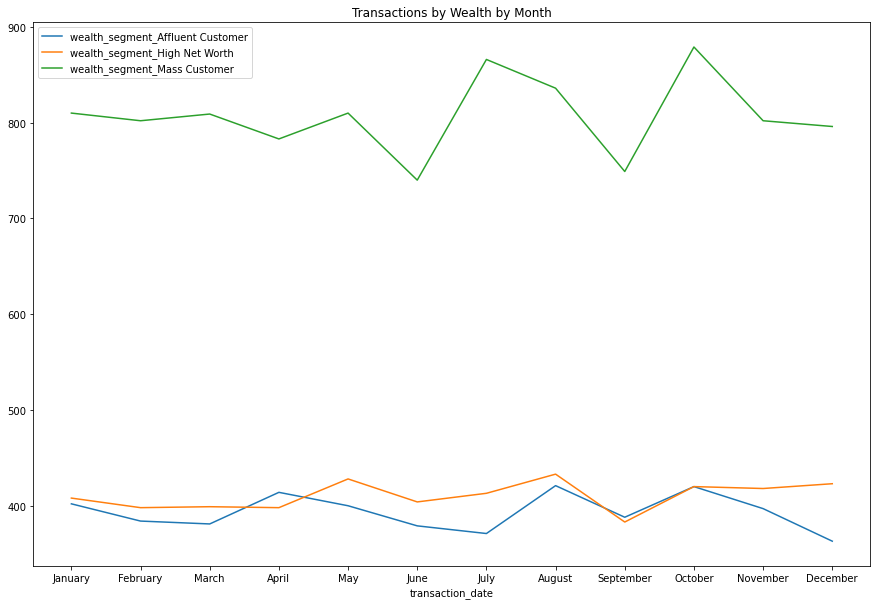

In [248]:
monthly_transactions_by_wealth_dummies=transactions_by_wealth_dummies.set_index('transaction_date')[['wealth_segment_Affluent Customer','wealth_segment_High Net Worth','wealth_segment_Mass Customer']].resample('M').sum()
monthly_transactions_by_wealth_dummies.index=monthly_transactions_by_wealth_dummies.index.strftime('%B')
monthly_transactions_by_wealth_dummies_plot=monthly_transactions_by_wealth_dummies.plot(xticks=range(len(monthly_transactions_by_wealth_dummies)),figsize=(15,10)).set_title('Transactions by Wealth by Month');

In [249]:
monthly_transactions_by_wealth_dummies_plot.figure.savefig('Transactions by Wealth by Month.png')

In [250]:
transactions.set_index('transaction_date')['product_profit'].resample('M').sum().rename('monthly_product_profit')

transaction_date
2017-01-31    929487.739988
2017-02-28    870819.060000
2017-03-31    879243.400000
2017-04-30    904691.310000
2017-05-31    913742.610000
2017-06-30    859571.550000
2017-07-31    938619.290000
2017-08-31    970452.520000
2017-09-30    862290.490000
2017-10-31    984973.464984
2017-11-30    924938.460000
2017-12-31    891454.070000
Freq: M, Name: monthly_product_profit, dtype: float64

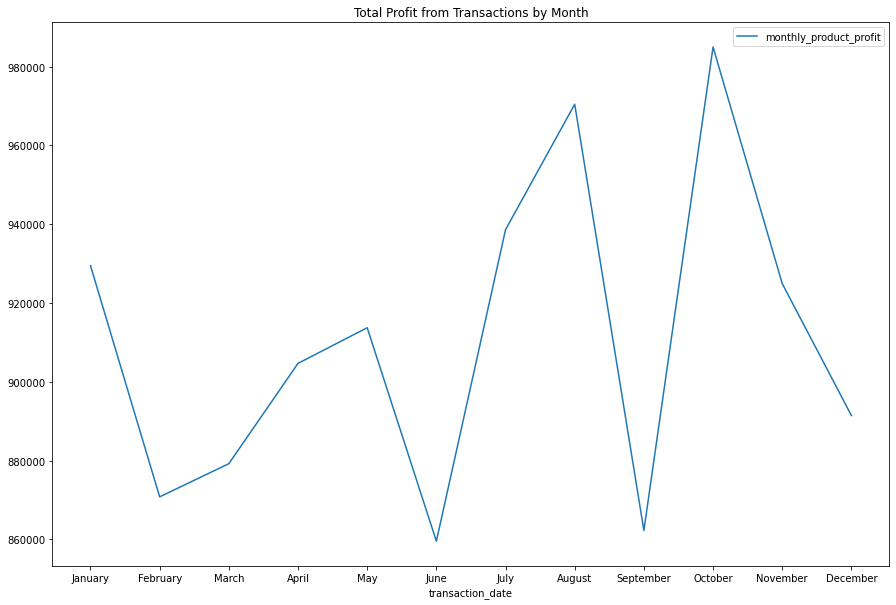

In [251]:
monthly_profits=transactions.set_index('transaction_date')['product_profit'].resample('M').sum().rename('monthly_product_profit')
monthly_profits.index=monthly_profits.index.strftime('%B')
monthly_profits=pd.DataFrame(monthly_profits)
monthly_profits_plot=monthly_profits.plot(xticks=range(len(monthly_profits)),figsize=(15,10)).set_title('Total Profit from Transactions by Month');

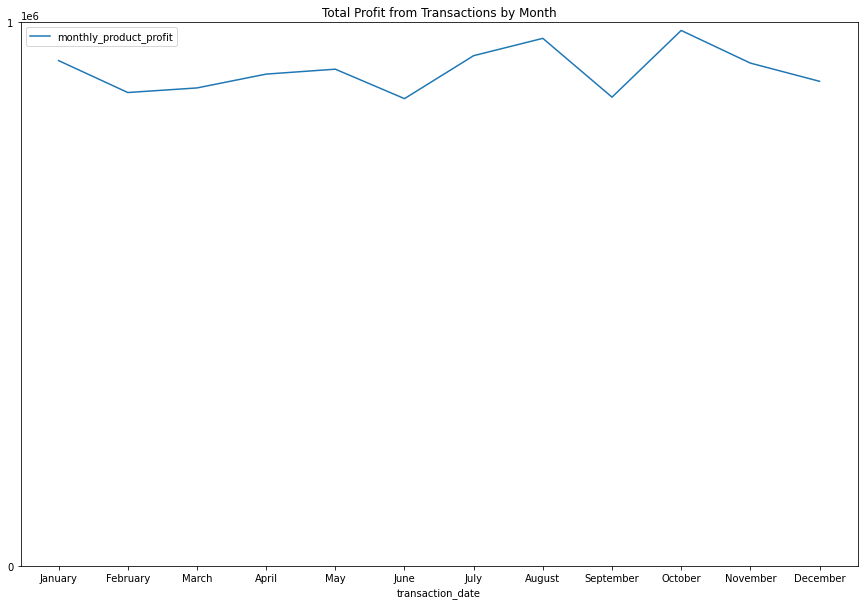

In [252]:
monthly_profits.plot(xticks=range(len(monthly_profits)),yticks=(0,1000000),figsize=(15,10)).set_title('Total Profit from Transactions by Month');

In [253]:
monthly_profits.T

transaction_date,January,February,March,April,May,June,July,August,September,October,November,December
monthly_product_profit,929487.739988,870819.06,879243.4,904691.31,913742.61,859571.55,938619.29,970452.52,862290.49,984973.464984,924938.46,891454.07


In [254]:
monthly_profits_plot.figure.savefig('Total Profit from Transactions by Month.png')

In [255]:
transactions_profits_by_wealth_dummies=pd.concat([transactions_customers[['customer_id','transaction_date','product_profit']],transactions_dummies],axis=1)
transactions_profits_by_wealth_dummies

,customer_id,transaction_date,product_profit,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
0,2950,2017-02-25,17.87,0,0,1
1,2950,2017-10-16,448.68,0,0,1
2,2950,2017-04-26,179.44,0,0,1
3,3120,2017-05-21,1702.55,0,0,1
4,3120,2017-10-05,451.65,0,0,1
...,...,...,...,...,...,...
19322,3168,2017-02-21,356.50,1,0,0
19323,3168,2017-04-11,1408.91,1,0,0
19324,3168,2017-06-03,1702.55,1,0,0
19325,3168,2017-09-30,1702.55,1,0,0


In [256]:
transactions_profits_by_wealth=transactions_profits_by_wealth_dummies.iloc[:,3:].mul(transactions_profits_by_wealth_dummies['product_profit'],axis=0)
transactions_profits_by_wealth

,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
0,0.00,0.0,17.87
1,0.00,0.0,448.68
2,0.00,0.0,179.44
3,0.00,0.0,1702.55
4,0.00,0.0,451.65
...,...,...,...
19322,356.50,0.0,0.00
19323,1408.91,0.0,0.00
19324,1702.55,0.0,0.00
19325,1702.55,0.0,0.00


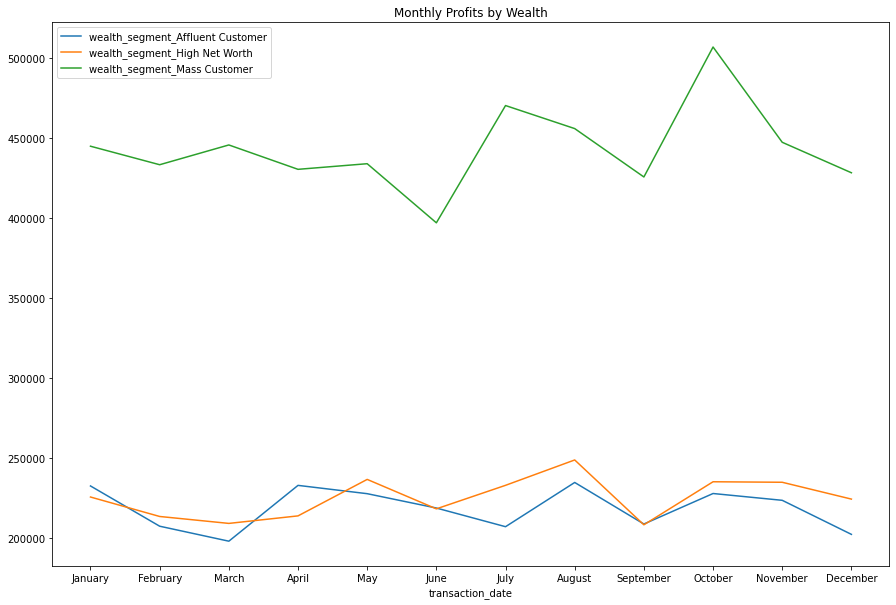

In [257]:
monthly_profits_by_wealth=pd.concat([transactions_customers[['transaction_date']],transactions_profits_by_wealth],axis=1).set_index('transaction_date').resample('M').sum()
monthly_profits_by_wealth.index=monthly_profits_by_wealth.index.strftime('%B')
monthly_profits_by_wealth_plot=monthly_profits_by_wealth.plot(xticks=range(len(monthly_profits_by_wealth)),figsize=(15,10)).set_title('Monthly Profits by Wealth');

In [258]:
monthly_profits_by_wealth

,wealth_segment_Affluent Customer,wealth_segment_High Net Worth,wealth_segment_Mass Customer
transaction_date,,,
January,232576.66,225663.22,444878.07
February,207426.85,213509.19,433311.63
March,198068.16,209180.97,445664.70
April,232941.35,213876.29,430435.57
May,227750.91,236671.08,433945.47
June,218786.42,218273.79,397015.94
July,207121.95,232973.84,470291.80
August,234759.58,248822.71,455892.37
September,208794.40,208308.66,425659.42


In [259]:
monthly_profits_by_wealth_plot.figure.savefig('Monthly Profits by Wealth.png')

In [345]:
average_monthly_profits=(transactions.set_index('transaction_date')['product_profit'].resample('M').mean().rename('average_monthly_product_profit'))/3
average_monthly_profits.index=average_monthly_profits.index.strftime('%B')
# average_monthly_profits=pd.DataFrame(average_monthly_profits)
# average_monthly_profits_plot=average_monthly_profits.plot(xticks=range(len(average_monthly_profits)),figsize=(15,10)).set_title('Average Profit per Transaction by Month');

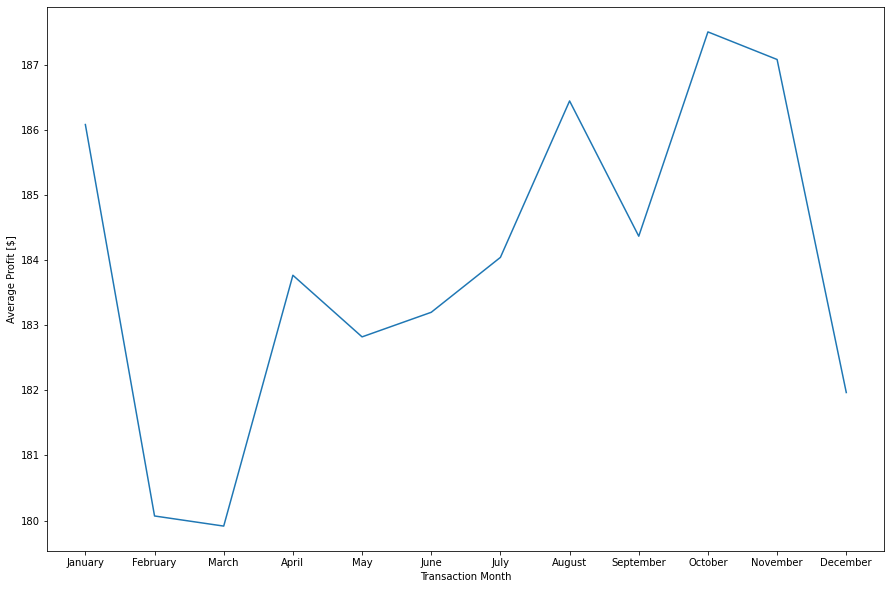

In [354]:
plt.subplots(figsize=[15,10])
average_transaction_profit_plot = sns.lineplot(data = average_monthly_profits, sort = False);
plt.xlabel('Transaction Month', fontsize=10)
plt.ylabel('Average Profit [$]', fontsize=10);

In [359]:
average_transaction_profit_plot.figure.savefig('Average Profit per Transaction.PNG')

In [261]:
average_monthly_profits.T

transaction_date
January      186.083632
February     180.070112
March        179.914753
April        183.768294
May          182.821651
June         183.199393
July         184.042998
August       186.446209
September    184.368290
October      187.506847
November     187.083022
December     181.966538
Name: average_monthly_product_profit, dtype: float64

In [357]:
average_monthly_profits_by_wealth=pd.concat([transactions_customers[['transaction_date']],transactions_profits_by_wealth],axis=1).set_index('transaction_date').resample('M').mean()
average_monthly_profits_by_wealth.index=average_monthly_profits_by_wealth.index.strftime('%B')
# average_monthly_profits_by_wealth_plot=average_monthly_profits_by_wealth.plot(xticks=range(len(average_monthly_profits_by_wealth)),figsize=(15,10)).set_title('Average Profit per Transaction by Wealth');

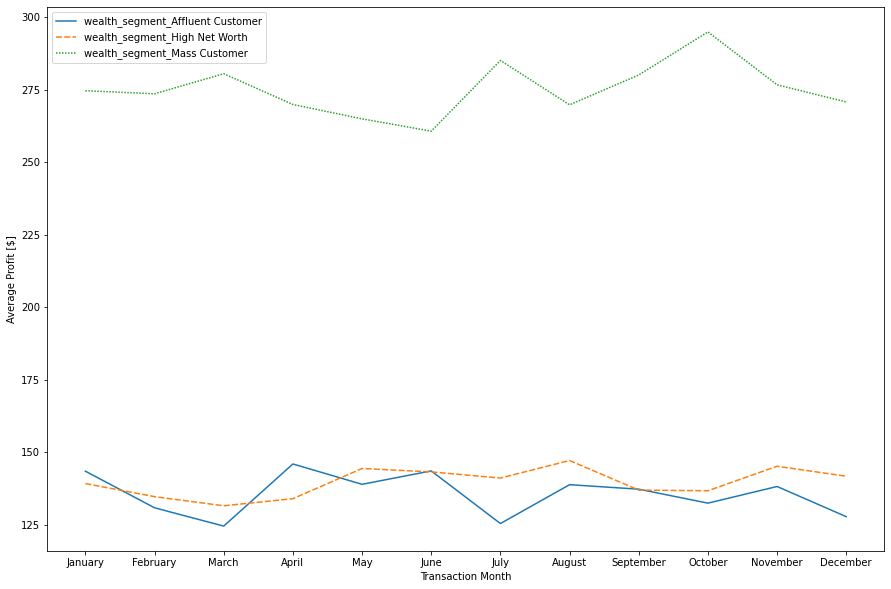

In [358]:
plt.subplots(figsize=[15,10])
average_transaction_profit_plot_wealth = sns.lineplot(data = average_monthly_profits_by_wealth, sort = False);
plt.xlabel('Transaction Month', fontsize=10)
plt.ylabel('Average Profit [$]', fontsize=10);

In [390]:
average_transaction_profit_plot_wealth.figure.savefig('Average Profit per Transaction by Wealth.PNG')

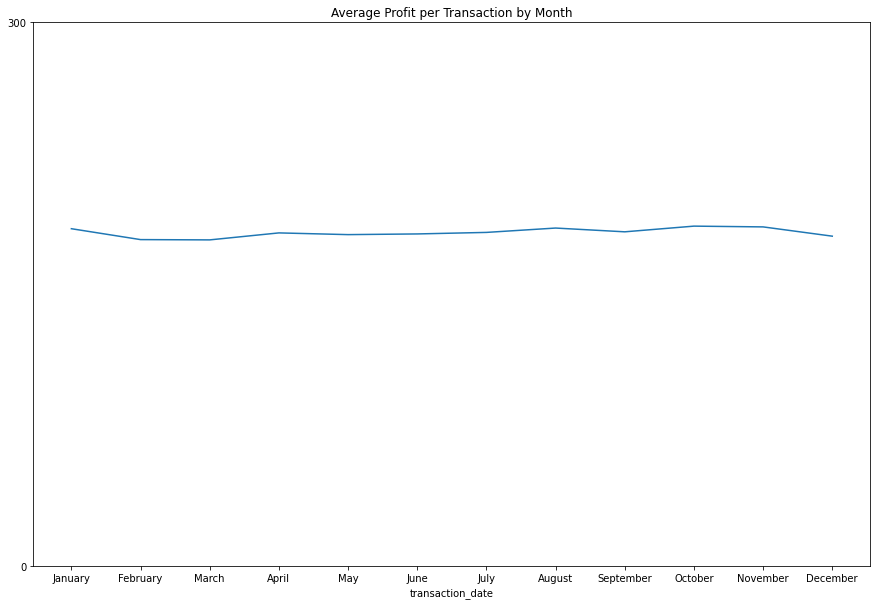

In [263]:
average_monthly_profits.plot(xticks=range(len(average_monthly_profits)),yticks=[0,300],figsize=(15,10)).set_title('Average Profit per Transaction by Month');

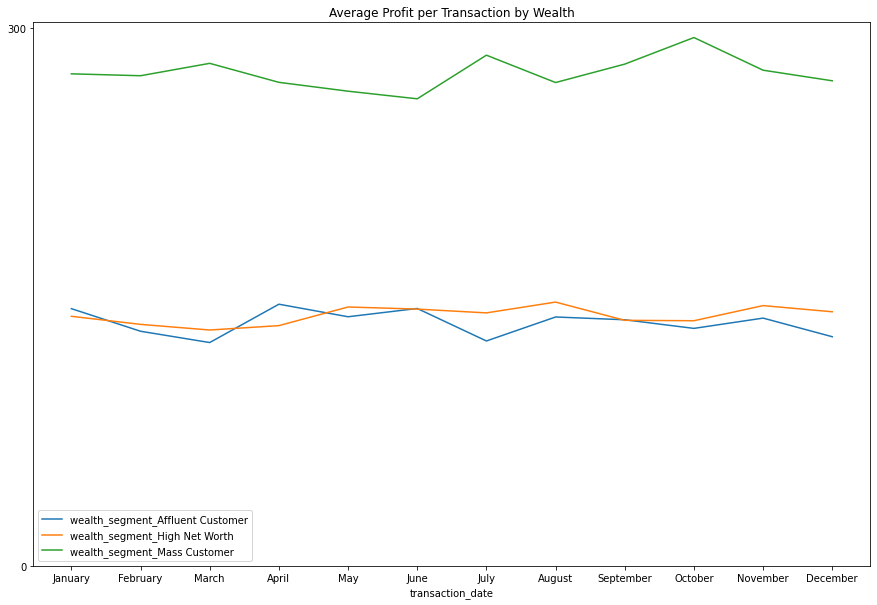

In [264]:
average_monthly_profits_by_wealth.plot(xticks=range(len(average_monthly_profits_by_wealth)),yticks=[0,300],figsize=(15,10)).set_title('Average Profit per Transaction by Wealth');

In [265]:
average_monthly_profits_by_wealth.T

transaction_date,January,February,March,April,May,June,July,August,September,October,November,December
wealth_segment_Affluent Customer,143.565840,130.951294,124.649566,146.044734,139.042070,143.654905,125.528455,138.910994,137.364737,132.550896,138.285510,127.893862
wealth_segment_High Net Worth,139.298284,134.791155,131.643153,134.091718,144.487839,143.318313,141.196267,147.232373,137.045171,136.825468,145.258287,141.824886
wealth_segment_Mass Customer,274.616093,273.555322,280.468660,269.865561,264.923974,260.680197,285.025333,269.758799,280.039092,294.866236,276.640649,270.726195


In [266]:
average_monthly_profits_by_wealth_plot.figure.savefig('Average Profit per Transaction by Wealth.png')

In [267]:
profit_table=pd.concat([monthly_profits,average_monthly_profits],axis=1)
profit_table

,monthly_product_profit,average_monthly_product_profit
transaction_date,,
January,929487.739988,186.083632
February,870819.060000,180.070112
March,879243.400000,179.914753
April,904691.310000,183.768294
May,913742.610000,182.821651
June,859571.550000,183.199393
July,938619.290000,184.042998
August,970452.520000,186.446209
September,862290.490000,184.368290


In [268]:
new_customer_list=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='NewCustomerList',skiprows=1).reset_index(drop=True)
now = pd.to_datetime('now')
new_customer_list['age']=(now - new_customer_list['DOB']).astype('<m8[Y]')
new_customer_list.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value,age
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,Australia,6,0.56,0.7000,0.8750,0.743750,1,1,1.718750,63.0
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,Australia,11,0.89,0.8900,1.1125,0.945625,1,1,1.718750,50.0
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,Australia,5,1.01,1.0100,1.0100,1.010000,1,1,1.718750,46.0
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,Australia,1,0.87,1.0875,1.0875,1.087500,4,4,1.703125,41.0
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,Australia,9,0.52,0.5200,0.6500,0.650000,4,4,1.703125,54.0


In [269]:
new_customer_list.drop(columns=['DOB','job_title','first_name','last_name','deceased_indicator','address','postcode','country','Unnamed: 16','Unnamed: 17','Unnamed: 18','Unnamed: 19','Unnamed: 20','Rank','Value'],inplace=True)
new_customer_list

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age
0,Male,86,Manufacturing,Mass Customer,Yes,14,QLD,6,63.0
1,Male,69,Property,Mass Customer,No,16,NSW,11,50.0
2,Female,10,Financial Services,Affluent Customer,No,10,VIC,5,46.0
3,Female,64,Manufacturing,Affluent Customer,Yes,5,QLD,1,41.0
4,Female,34,Financial Services,Affluent Customer,No,19,NSW,9,54.0
...,...,...,...,...,...,...,...,...,...
995,Male,60,Financial Services,Affluent Customer,No,9,NSW,7,60.0
996,Male,22,Health,Mass Customer,No,6,NSW,10,18.0
997,Female,17,Financial Services,Affluent Customer,Yes,15,QLD,2,65.0
998,Male,30,Financial Services,Mass Customer,Yes,19,QLD,2,67.0


In [270]:
new_customer_list.dropna(subset=['age'],inplace=True)
new_customer_list.fillna('N/A',inplace=True)
new_customer_list.count()

gender                                 983
past_3_years_bike_related_purchases    983
job_industry_category                  983
wealth_segment                         983
owns_car                               983
tenure                                 983
state                                  983
property_valuation                     983
age                                    983
dtype: int64

In [271]:
driver_name = '{ODBC Driver 17 for SQL Server}'
server_name = 'DESKTOP-OVRCKME'
database_name = 'KPMG_Virtual_Internship_DB'
trusted_connection = 'yes'

engine = sqlalchemy.create_engine('mssql+pyodbc://@DESKTOP-OVRCKME/KPMG_Virtual_Internship_DB?trusted_connection=yes&driver=ODBC+Driver+17+for+SQL+Server')

### SQL database
#### Store SQL Data

In [272]:
# Python package for reading information from SQL database

# Credentials
driver_name = '[Driver Name]'
server_name = '[Server Name]'
database_name = '[Database Name]'
trusted_connection = 'yes'

driver_name = '{ODBC Driver 17 for SQL Server}'
server_name = 'DESKTOP-OVRCKME'
database_name = 'KPMG_Virtual_Internship_DB'
trusted_connection = 'yes'

# Connect to SQL Server
conn = pyodbc.connect(Driver=driver_name,
                      Server=server_name,
                      Database=database_name,
                      Trusted_Connection=trusted_connection)
cursor = conn.cursor()

#### Read SQL Data

In [273]:
# Python engine for writing to SQL data

engine=sqlalchemy.create_engine('mssql+pyodbc://@[Server Name]/[Database Name]?trusted_connection=yes&driver=[Driver Name]')

engine = sqlalchemy.create_engine('mssql+pyodbc://@DESKTOP-OVRCKME/KPMG_Virtual_Internship_DB?trusted_connection=yes&driver=ODBC+Driver+17+for+SQL+Server')

In [274]:
transactions.shape

(19803, 15)

In [275]:
transactions.to_sql('Transactions',con=engine,if_exists='replace',index=False)

In [276]:
pd.read_sql('SELECT * FROM Transactions',engine).head(15)

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,product_profit,profit_margin
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,17.87,0.249965
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,1702.55,0.814045
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,1544.61,0.861260
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,817.36,0.682009
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,1055.82,0.598097
5,6,25,2339,2017-03-08,1.0,Approved,Giant Bicycles,Road,medium,medium,1538.99,829.65,39031.0,709.34,0.460913
6,7,22,1542,2017-04-21,1.0,Approved,WeareA2B,Standard,medium,medium,60.34,45.26,34165.0,15.08,0.249917
7,8,15,2459,2017-07-15,0.0,Approved,WeareA2B,Standard,medium,medium,1292.84,13.44,39915.0,1279.40,0.989604
8,9,67,1305,2017-08-10,0.0,Approved,Solex,Standard,medium,large,1071.23,380.74,33455.0,690.49,0.644577
9,10,12,3262,2017-08-30,1.0,Approved,WeareA2B,Standard,medium,medium,1231.15,161.60,38216.0,1069.55,0.868741


In [277]:
new_customer_list.shape

(983, 9)

In [278]:
new_customer_list.to_sql('New Customers',con=engine,if_exists='replace',index=False)

In [279]:
customer_demographic_address.shape

(3908, 18)

In [280]:
customer_demographic_address.to_sql('Customers',con=engine,if_exists='replace',index=False)

In [281]:
customer_demographic_address_profits.shape # With calculated profits per customer id

(3412, 20)

In [282]:
customer_demographic_address_profits.to_sql('Customer Profits',con=engine,if_exists='replace',index=False)

In [283]:
customer_profits.shape # Sorted by product_id for profits

(101, 4)

In [284]:
customer_profits.to_sql('Product ID',con=engine,if_exists='replace',index=False)

In [285]:
bikes_counts_average_list_profit_profit_margins.shape # Sorted by brand for profits

(6, 4)

In [286]:
bikes_counts_average_list_profit_profit_margins.to_sql('Brand',con=engine,if_exists='replace',index=False)

In [287]:
bikes_line_counts_average_list_profit_profit_margins.shape # Sorted by product line for profits

(4, 4)

In [288]:
bikes_line_counts_average_list_profit_profit_margins.to_sql('Product Line',con=engine,if_exists='replace',index=False)

In [289]:
bikes_class_counts_average_list_profit_profit_margins.shape # Sorted by product class for profits

(3, 4)

In [290]:
bikes_class_counts_average_list_profit_profit_margins.to_sql('Product Class',con=engine,if_exists='replace',index=False)

### Buid and train model

In [291]:
X=customer_demographic_address_profits_clean.iloc[:,:-1]
X

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age
0,Female,93,Health,Mass Customer,Yes,11.0,NSW,10,66.0
1,Male,81,Financial Services,Mass Customer,Yes,16.0,NSW,10,39.0
2,Male,33,IT,Mass Customer,No,7.0,QLD,9,58.0
3,Female,56,N/A,Affluent Customer,Yes,8.0,NSW,4,43.0
4,Male,35,Retail,High Net Worth,Yes,13.0,VIC,9,54.0
...,...,...,...,...,...,...,...,...,...
3406,Male,99,Manufacturing,Mass Customer,Yes,19.0,NSW,9,34.0
3407,Female,73,Manufacturing,Affluent Customer,Yes,18.0,VIC,5,34.0
3408,Female,28,Manufacturing,Mass Customer,No,5.0,VIC,4,24.0
3409,Male,29,Manufacturing,Mass Customer,Yes,7.0,QLD,9,41.0


In [292]:
#X['postcode']=X['postcode'].astype('object')

In [293]:
y=pd.DataFrame(customer_demographic_address_profits_clean.iloc[:,-1])
y

,bike_purchases
0,11
1,3
2,2
3,6
4,5
...,...
3406,4
3407,3
3408,6
3409,7


In [294]:
le = preprocessing.LabelEncoder()

In [295]:
X_objects=X.dtypes=='object'
X_objects

gender                                  True
past_3_years_bike_related_purchases    False
job_industry_category                   True
wealth_segment                          True
owns_car                                True
tenure                                 False
state                                   True
property_valuation                     False
age                                    False
dtype: bool

In [296]:
X.columns

Index(['gender', 'past_3_years_bike_related_purchases',
       'job_industry_category', 'wealth_segment', 'owns_car', 'tenure',
       'state', 'property_valuation', 'age'],
      dtype='object')

In [297]:
X[['tenure','age']]=X[['tenure','age']].astype('int64')

In [298]:
X.dtypes

gender                                 object
past_3_years_bike_related_purchases     int64
job_industry_category                  object
wealth_segment                         object
owns_car                               object
tenure                                  int64
state                                  object
property_valuation                      int64
age                                     int64
dtype: object

In [299]:
X_label_encoded=[le.fit_transform(X.iloc[:,i]) for i in range(len(X.columns))]
X_label_encoded=pd.DataFrame(X_label_encoded).T
X_label_encoded

,0,1,2,3,4,5,6,7,8
0,0,93,3,2,1,10,0,9,48
1,1,81,2,2,1,15,0,9,21
2,1,33,4,2,0,6,1,8,40
3,0,56,6,0,1,7,0,3,25
4,1,35,8,1,1,12,2,8,36
...,...,...,...,...,...,...,...,...,...
3406,1,99,5,2,1,18,0,8,16
3407,0,73,5,0,1,17,2,4,16
3408,0,28,5,2,0,4,2,3,6
3409,1,29,5,2,1,6,1,8,23


In [300]:
X_customer_model_data_encoded = customer_model_data_encoded.drop(columns=customer_model_data_encoded.columns[~0])

In [301]:
y=y.astype('int64')

In [302]:
X_train, X_test, y_train, y_test = train_test_split(X_label_encoded, y, test_size=0.35)

In [303]:
X_train.shape

(2217, 9)

In [304]:
X_test.shape

(1194, 9)

In [305]:
y_train.shape

(2217, 1)

In [306]:
y_test.shape

(1194, 1)

In [307]:
# Create decision tree classifier
regressor = DecisionTreeRegressor(max_depth=6)

regressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=6,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [308]:
yhat = regressor.predict(X_test)

In [309]:
explained_variance_score(y_test, yhat)

-0.14434651727219916

In [310]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, yhat)))

Mean Absolute Error: 2.0031840172638575
Mean Squared Error: 6.332015626978186
Root Mean Squared Error: 2.5163496630989473


In [311]:
r2_score(y_test, yhat)

-0.1443474558095712

In [312]:
profits_mean=customer_demographic_address_profits_clean['bike_purchases'].mean()

In [313]:
profits_mean

5.663734975080621

In [314]:
# Mean is 3120 with a STD of 1770 / 189?
((metrics.mean_absolute_error(y_test, yhat)) / profits_mean) * 100

35.36860439405258

In [315]:
pd.DataFrame(regressor.feature_importances_,index=X.columns,columns=['Feature Importance']).sort_values(by=['Feature Importance'],ascending=False)

,Feature Importance
past_3_years_bike_related_purchases,0.263839
tenure,0.228739
age,0.181845
job_industry_category,0.078635
property_valuation,0.078019
state,0.064535
gender,0.058190
owns_car,0.030845
wealth_segment,0.015353


In [316]:
X

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age
0,Female,93,Health,Mass Customer,Yes,11,NSW,10,66
1,Male,81,Financial Services,Mass Customer,Yes,16,NSW,10,39
2,Male,33,IT,Mass Customer,No,7,QLD,9,58
3,Female,56,N/A,Affluent Customer,Yes,8,NSW,4,43
4,Male,35,Retail,High Net Worth,Yes,13,VIC,9,54
...,...,...,...,...,...,...,...,...,...
3406,Male,99,Manufacturing,Mass Customer,Yes,19,NSW,9,34
3407,Female,73,Manufacturing,Affluent Customer,Yes,18,VIC,5,34
3408,Female,28,Manufacturing,Mass Customer,No,5,VIC,4,24
3409,Male,29,Manufacturing,Mass Customer,Yes,7,QLD,9,41


In [317]:
# Drop addition columns to increase accuracy
# X_2=X.drop(columns=['state','gender','tenure','owns_car','job_industry_category','past_3_years_bike_related_purchases','3_year_product_profit'])
X_2=X[['past_3_years_bike_related_purchases','wealth_segment','property_valuation','age']]

In [318]:
X_2_label_encoded=[le.fit_transform(X_2.iloc[:,i]) for i in range(len(X_2.columns))]
X_2_label_encoded=pd.DataFrame(X_2_label_encoded).T
X_2_label_encoded

,0,1,2,3
0,93,2,9,48
1,81,2,9,21
2,33,2,8,40
3,56,0,3,25
4,35,1,8,36
...,...,...,...,...
3406,99,2,8,16
3407,73,0,4,16
3408,28,2,3,6
3409,29,2,8,23


In [319]:
X_train, X_test, y_train, y_test = train_test_split(X_2_label_encoded, y, test_size=0.35)

In [320]:
# Decision tree classifier
regressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=6,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

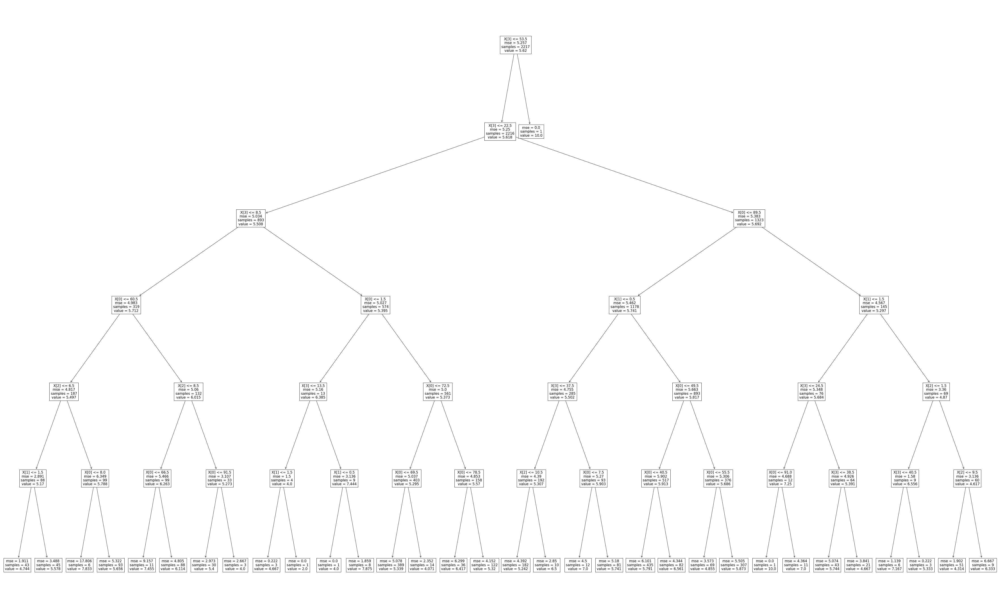

In [321]:
from matplotlib.pylab import rcParams

##set up the parameters
rcParams['figure.figsize'] = 80,50

tree.plot_tree(regressor);

In [322]:
yhat = regressor.predict(X_test)
yhat

array([5.87296417, 5.7908046 , 6.41666667, ..., 5.7908046 , 5.7908046 ,
       5.7908046 ])

In [323]:
#y_test=y_test.reset_index(drop=True)
#y_test.T

In [324]:
#yhat=pd.DataFrame(yhat)
#yhat.T

In [325]:
r2_score(y_test, yhat)

-0.08836583350121585

In [326]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, yhat)))

Mean Absolute Error: 1.9548876193110285
Mean Squared Error: 5.973332362273922
Root Mean Squared Error: 2.444040171984479


In [327]:
explained_variance_score(y_test, yhat)

-0.08611295627118909

In [328]:
evaluation_data=[round(metrics.mean_absolute_error(y_test, yhat),3),round(metrics.mean_squared_error(y_test, yhat),3),round(np.sqrt(metrics.mean_squared_error(y_test, yhat)),3)]
evaluation_data=pd.DataFrame(evaluation_data,index=['Mean Absolute Error','Mean Squared Error','Root Mean Squared Error'],columns=['Score'])
evaluation_data

,Score
Mean Absolute Error,1.955
Mean Squared Error,5.973
Root Mean Squared Error,2.444


                         Score
Mean Absolute Error      1.955
Mean Squared Error       5.973
Root Mean Squared Error  2.444


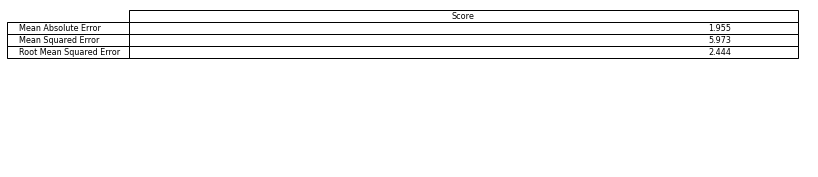

In [329]:
df = evaluation_data
print(evaluation_data)

# set fig size
fig, ax = plt.subplots(figsize=(12, 3)) 
# no axes
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
# no frame
ax.set_frame_on(False)  
# plot table
tab = table(ax, df, loc='upper right')  
# set font manually
tab.auto_set_font_size(False)
tab.set_fontsize(8) 
# save the result
plt.savefig('Evaluation Scores.png')

In [330]:
# Mean is 3120 with a STD of 1770
((metrics.mean_absolute_error(y_test, yhat)) / profits_mean) * 100

34.51587385201055

44% of mean with a standard deviation of +/-1?

In [331]:
important_features=pd.DataFrame(regressor.feature_importances_,index=X_2.columns,columns=['Feature Importance']).sort_values(by=['Feature Importance'],ascending=False)
important_features

,Feature Importance
past_3_years_bike_related_purchases,0.455581
age,0.252780
property_valuation,0.174036
wealth_segment,0.117603


                                     Feature Importance
past_3_years_bike_related_purchases            0.455581
age                                            0.252780
property_valuation                             0.174036
wealth_segment                                 0.117603


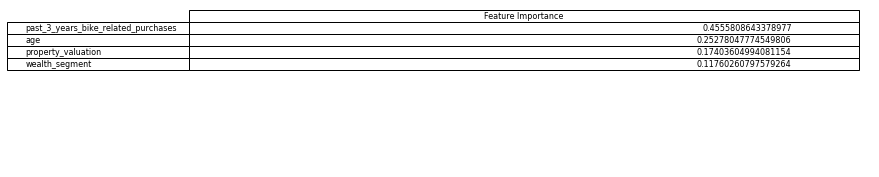

In [332]:
df = important_features
print(important_features)

# set fig size
fig, ax = plt.subplots(figsize=(12, 3)) 
# no axes
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
# no frame
ax.set_frame_on(False)  
# plot table
tab = table(ax, df, loc='upper right')  
# set font manually
tab.auto_set_font_size(False)
tab.set_fontsize(8) 
# save the result
plt.savefig('Feature Importance Scores.png')

In [333]:
customer_profit_total

,3_year_product_profit
customer_id,
1,3018.090000
2,2226.260000
3,3362.810000
4,220.570000
5,2394.940000
...,...
3497,1648.320000
3498,3147.330000
3499,4955.250000


In [334]:
new_customer_list

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation,age
0,Male,86,Manufacturing,Mass Customer,Yes,14,QLD,6,63.0
1,Male,69,Property,Mass Customer,No,16,NSW,11,50.0
2,Female,10,Financial Services,Affluent Customer,No,10,VIC,5,46.0
3,Female,64,Manufacturing,Affluent Customer,Yes,5,QLD,1,41.0
4,Female,34,Financial Services,Affluent Customer,No,19,NSW,9,54.0
...,...,...,...,...,...,...,...,...,...
995,Male,60,Financial Services,Affluent Customer,No,9,NSW,7,60.0
996,Male,22,Health,Mass Customer,No,6,NSW,10,18.0
997,Female,17,Financial Services,Affluent Customer,Yes,15,QLD,2,65.0
998,Male,30,Financial Services,Mass Customer,Yes,19,QLD,2,67.0


In [335]:
X_2.columns.to_list()

['past_3_years_bike_related_purchases',
 'wealth_segment',
 'property_valuation',
 'age']

In [336]:
new_customer_list[['wealth_segment','property_valuation','age']]

,wealth_segment,property_valuation,age
0,Mass Customer,6,63.0
1,Mass Customer,11,50.0
2,Affluent Customer,5,46.0
3,Affluent Customer,1,41.0
4,Affluent Customer,9,54.0
...,...,...,...
995,Affluent Customer,7,60.0
996,Mass Customer,10,18.0
997,Affluent Customer,2,65.0
998,Mass Customer,2,67.0


In [337]:
new_customer_list.drop(columns=['state','gender','tenure','owns_car','job_industry_category','past_3_years_bike_related_purchases'])

,wealth_segment,property_valuation,age
0,Mass Customer,6,63.0
1,Mass Customer,11,50.0
2,Affluent Customer,5,46.0
3,Affluent Customer,1,41.0
4,Affluent Customer,9,54.0
...,...,...,...
995,Affluent Customer,7,60.0
996,Mass Customer,10,18.0
997,Affluent Customer,2,65.0
998,Mass Customer,2,67.0


In [338]:
# Load new customer dataset into dataframe and drop unneeded columns
# Old version # X_cust=new_customer_list.drop(columns=['state','gender','tenure','owns_car','job_industry_category','past_3_years_bike_related_purchases'])
X_cust=new_customer_list[X_2.columns.to_list()]
# Label encode new customer set
X_cust=[le.fit_transform(X_cust.iloc[:,i]) for i in range(len(X_cust.columns))]
X_cust=pd.DataFrame(X_cust).T
X_cust

,0,1,2,3
0,86,2,5,45
1,69,2,10,32
2,10,0,4,28
3,64,0,0,23
4,34,0,8,36
...,...,...,...,...
978,60,0,6,42
979,22,2,9,0
980,17,0,1,47
981,30,2,1,49


In [339]:
y_pred = regressor.predict(X_cust)
predicted_values=pd.DataFrame(y_pred,columns=['predicted 3 year profit'])
predicted_values

,predicted 3 year profit
0,5.872964
1,5.872964
2,5.241758
3,5.241758
4,5.241758
...,...
978,5.740741
979,5.655914
980,5.740741
981,5.790805


In [340]:
current_customer_list=pd.read_excel('Sprocket Central Data - KPMG.xlsx',sheet_name='NewCustomerList',skiprows=1).reset_index(drop=True)
current_customer_list

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,QLD,Australia,6,0.56,0.7000,0.875000,0.743750,1,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,NSW,Australia,11,0.89,0.8900,1.112500,0.945625,1,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,VIC,Australia,5,1.01,1.0100,1.010000,1.010000,1,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,QLD,Australia,1,0.87,1.0875,1.087500,1.087500,4,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,NSW,Australia,9,0.52,0.5200,0.650000,0.650000,4,4,1.703125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Ferdinand,Romanetti,Male,60,1959-10-07,Paralegal,Financial Services,Affluent Customer,N,No,...,NSW,Australia,7,0.79,0.7900,0.790000,0.790000,996,996,0.374000
996,Burk,Wortley,Male,22,2001-10-17,Senior Sales Associate,Health,Mass Customer,N,No,...,NSW,Australia,10,0.76,0.7600,0.950000,0.807500,997,997,0.357000
997,Melloney,Temby,Female,17,1954-10-05,Budget/Accounting Analyst IV,Financial Services,Affluent Customer,N,Yes,...,QLD,Australia,2,0.85,1.0625,1.062500,1.062500,997,997,0.357000
998,Dickie,Cubbini,Male,30,1952-12-17,Financial Advisor,Financial Services,Mass Customer,N,Yes,...,QLD,Australia,2,1.09,1.3625,1.362500,1.158125,997,997,0.357000


In [341]:
current_customer_list=current_customer_list.merge(predicted_values, left_index=True, right_index=True)
current_customer_list

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value,predicted 3 year profit
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,Australia,6,0.56,0.7000,0.8750,0.743750,1,1,1.718750,5.872964
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,Australia,11,0.89,0.8900,1.1125,0.945625,1,1,1.718750,5.872964
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,Australia,5,1.01,1.0100,1.0100,1.010000,1,1,1.718750,5.241758
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,Australia,1,0.87,1.0875,1.0875,1.087500,4,4,1.703125,5.241758
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,Australia,9,0.52,0.5200,0.6500,0.650000,4,4,1.703125,5.241758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
978,Artemis,Swanson,Male,77,1977-02-12,Web Designer II,Argiculture,Mass Customer,N,Yes,...,Australia,5,0.84,1.0500,1.0500,0.892500,979,979,0.416500,5.740741
979,Daryle,Marginson,Male,93,1986-06-27,Environmental Tech,Argiculture,Mass Customer,N,Yes,...,Australia,12,0.44,0.5500,0.6875,0.584375,979,979,0.416500,5.655914
980,Tyne,Anshell,Female,71,1992-04-08,Mechanical Systems Engineer,NaN,Mass Customer,N,Yes,...,Australia,8,0.51,0.6375,0.6375,0.541875,979,979,0.416500,5.740741
981,Leona,Shorrock,Female,83,1951-08-23,Senior Quality Engineer,Financial Services,Affluent Customer,N,Yes,...,Australia,1,0.44,0.5500,0.6875,0.687500,979,979,0.416500,5.790805


In [342]:
predicted_customer_list=current_customer_list.sort_values(by='predicted 3 year profit',ascending=False)
predicted_customer_list

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value,predicted 3 year profit
619,Delcina,Hursey,Female,22,1968-12-26,NaN,Financial Services,Mass Customer,N,Yes,...,Australia,4,0.55,0.6875,0.687500,0.584375,620,620,0.750000,10.000000
670,Ted,Izacenko,Male,3,1959-08-01,Librarian,Entertainment,High Net Worth,N,No,...,Australia,10,0.75,0.7500,0.937500,0.937500,668,668,0.705500,10.000000
661,Giselbert,Pickring,Male,94,1959-07-28,Tax Accountant,Manufacturing,Affluent Customer,N,Yes,...,Australia,8,0.52,0.6500,0.812500,0.812500,662,662,0.711875,10.000000
656,Orly,Nesbitt,Female,6,1985-03-25,Analyst Programmer,Manufacturing,High Net Worth,N,Yes,...,Australia,6,0.78,0.9750,0.975000,0.975000,657,657,0.714000,10.000000
653,Caritta,Compston,Female,86,1958-04-25,Geological Engineer,Manufacturing,Mass Customer,N,Yes,...,Australia,5,0.65,0.8125,1.015625,0.863281,653,653,0.718750,10.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9,Barthel,Docket,Male,72,1985-08-02,Accounting Assistant IV,IT,Mass Customer,N,Yes,...,Australia,5,0.84,1.0500,1.050000,0.892500,10,10,1.640625,4.071429
33,Mikel,McNess,Male,71,1981-09-22,Nurse,NaN,Mass Customer,N,No,...,Australia,9,0.70,0.7000,0.875000,0.743750,32,32,1.453125,4.071429
902,Nilson,Wiggam,Male,48,1996-02-15,Paralegal,Financial Services,Mass Customer,N,No,...,Australia,6,0.98,0.9800,0.980000,0.833000,903,903,0.501500,4.071429
446,Garwin,Nurden,Male,54,1958-04-19,Programmer I,Property,High Net Worth,N,Yes,...,Australia,11,1.04,1.3000,1.625000,1.625000,444,444,0.900000,4.071429


In [343]:
predicted_customer_list.to_csv('predicted profits customer list.csv',index=False)